# 104_03 — Convergencia de las cadenas MCMC · Escenario B-1 · **barrido en $M$**

Paso **3a** del ciclo. Este notebook **sólo diagnostica las cadenas**: no
predice, no evalúa y no toca el bloque de prueba. Si algo aquí falla, los
números de `104_04` no significan nada, y por eso son notebooks separados.

| Estadístico | Referencia | Lectura |
|---|---|---|
| ESS | Geyer (1992) | $\gtrsim 400$ ideal, $>100$ aceptable |
| Geweke $z$ | test $z$ entre segmentos | $\lvert z\rvert < 2$ ⇒ no se rechaza |
| $\hat R$ | Gelman-Rubin | $< 1.1$ ⇒ convergencia |

El escenario **no cambia nada de este notebook**: sólo diagnostica cadenas. Lo único propio del B-1 es §6.1.



## 1. Imports, rutas y carga de artefactos

In [1]:
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import loadmat

from model_psbp_fd.pipelines import (
    cargar_datasets_ar, cargar_hiperparametros, cargar_config_evaluacion,
)
from model_psbp_fd.models.pspb_fd_v3 import PSBPPredictor
from model_psbp_fd.fit import (
    tabla_diagnosticos, resumen_convergencia, diagnostico_variable,
    extraer_traza_variable, matriz_pip, contraste_con_verdad,
)
from model_psbp_fd.graphics import (
    plot_global_components, plot_active_clusters,
    plot_convergence_bj, plot_convergence_pj,
)
from model_psbp_fd.utils import get_project_root, normalizar_trazas_mat

plt.style.use("seaborn-v0_8-darkgrid")
%matplotlib inline

In [2]:
PROJECT_ROOT = get_project_root()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# [CONFIG] 
BASENAME, ESCENARIO_ID, REPLICA_ID = "escenario_104", 1, 1
M_FPCA_LIST = (1, 2, 3, 4)

SALTAR_M_SIN_TRAZAS = True

M_FPCA_LIST = tuple(int(m) for m in M_FPCA_LIST)
assert len(set(M_FPCA_LIST)) == len(M_FPCA_LIST), "M_FPCA_LIST tiene repetidos."
assert all(m >= 1 for m in M_FPCA_LIST), "M debe ser >= 1."

EXPERIMENT_BASE = f"{BASENAME}_{ESCENARIO_ID}_r{REPLICA_ID:02d}"


def experiment_id(M: int) -> str:
    """Convención vigente desde la corrida 30: M viaja en el ID."""
    return f"{EXPERIMENT_BASE}_m{M:02d}"


def rutas(M: int) -> dict:
    eid = experiment_id(M)
    p = {
        "raw":          PROJECT_ROOT / "data" / "simulaciones" / "raw" / eid,
        "functional":   PROJECT_ROOT / "data" / "simulaciones" / "processed" / "functional" / eid,
        "predict":      PROJECT_ROOT / "data" / "simulaciones" / "processed" / "predict" / eid,
        "out_report":   PROJECT_ROOT / "reports" / "simulaciones" / eid,
        "out_artefact": PROJECT_ROOT / "artefact" / "simulaciones" / eid,
    }
    for r in p.values():
        r.mkdir(parents=True, exist_ok=True)
    return p


PATHS_M = {M: rutas(M) for M in M_FPCA_LIST}

# Las salidas que CRUZAN los M no caben en el directorio de ninguno de ellos:
# van a un directorio propio del barrido, hermano de los de cada punto.
PATH_BARRIDO = PROJECT_ROOT / "reports" / "simulaciones" / f"{EXPERIMENT_BASE}_barrido_M"
PATH_BARRIDO.mkdir(parents=True, exist_ok=True)

print(f"barrido en M : {list(M_FPCA_LIST)}")
for M in M_FPCA_LIST:
    print(f"  M={M}  ->  {experiment_id(M)}")
print(f"salidas cruzadas (§8) : {PATH_BARRIDO}   (archivos 80-83)")

barrido en M : [1, 2, 3, 4]
  M=1  ->  escenario_104_1_r01_m01
  M=2  ->  escenario_104_1_r01_m02
  M=3  ->  escenario_104_1_r01_m03
  M=4  ->  escenario_104_1_r01_m04
salidas cruzadas (§8) : C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\reports\simulaciones\escenario_104_1_r01_barrido_M   (archivos 80-83)


In [3]:
# Carga de artefactos por M. `EST[M]` es el estado completo de ese punto del
# barrido; todo lo que sigue lo consume por índice, nunca por variable global.
EST = {}
saltados = []

for M in M_FPCA_LIST:
    P = PATHS_M[M]
    if not (P["functional"] / "datasets_manifest.json").exists():
        saltados.append((M, "sin datasets_manifest.json - falta correr 104_01"))
        continue

    dfs_train, manifest = cargar_datasets_ar(P, bloque="train")
    hp_json     = cargar_hiperparametros(P)
    P["trazas"] = P["out_artefact"].parent / hp_json.get("trazas_en", P["out_artefact"].name)
    eval_config = cargar_config_evaluacion(P)

    component_idx = manifest["component_idx"]
    n_components  = len(component_idx)

    # El ID declara M; el manifest lo determina. Si discrepan, el directorio
    # está mal nombrado y todo lo demás sería una comparación entre otra cosa.
    assert n_components == M, (
        f"{experiment_id(M)} declara M={M} pero su manifest tiene "
        f"{n_components} componentes. El directorio no corresponde a este "
        "punto del barrido.")
    assert len(hp_json["hyperparams_list"]) == n_components, \
        f"[M={M}] n_components discrepa entre manifest e hyperparameters.json."

    EST[M] = {
        "paths": P, "eid": experiment_id(M),
        "dfs_train": dfs_train, "manifest": manifest,
        "hp_json": hp_json, "eval_config": eval_config,
        "component_idx": component_idx, "n_components": n_components,
        "cov_names": manifest["cov_names"],
        "cov_por_componente": [list(manifest["cov_por_componente"][str(k)]) for k in range(n_components)],
        "n_iter": int(hp_json["n_iter"]),
        "mcmc_cfg": hp_json["mcmc_config"],
        "burn": int(hp_json["mcmc_config"]["burn"]),
    }

assert EST, "Ningún punto del barrido tiene datos. Ejecuta 104_01 primero."

print(f"{'M':>3}  {'comp':>4}  {'cadenas':>7}  {'covariables':>11}  seed_base")
print(f"{'-'*3}  {'-'*4}  {'-'*7}  {'-'*11}  {'-'*9}")
for M, e in EST.items():
    print(f"{M:>3}  {e['n_components']:>4}  {e['n_iter']:>7}  "
          f"{len(e['cov_names']):>11}  {e['hp_json']['seed_base']}")
for M, motivo in saltados:
    print(f"  ! M={M} saltado: {motivo}")

_cfgs = {M: (e["mcmc_cfg"]["nsim"], e["mcmc_cfg"]["N"], e["burn"], e["n_iter"])
         for M, e in EST.items()}
if len(set(_cfgs.values())) > 1:
    print("\n! La configuración MCMC NO es la misma en todos los M:")
    for M, c in _cfgs.items():
        print(f"    M={M}: nsim/N/burn/cadenas = {c}")
    print("  Las diferencias entre M mezclarían efecto de M con efecto de ajuste.")
else:
    print(f"\nOK misma configuración MCMC en todos los M: "
          f"nsim/N/burn/cadenas = {next(iter(_cfgs.values()))}")

  M  comp  cadenas  covariables  seed_base
---  ----  -------  -----------  ---------
  1     1        2            4  41232
  2     2        2            8  41232
  3     3        2           12  41232
  4     4        2           16  41232

OK misma configuración MCMC en todos los M: nsim/N/burn/cadenas = (3000, 30, 1000, 2)


## 2. Lectura de las trazas


In [4]:
_CLAVES_TRAZA = ["betajhout", "beta0hout", "tauhout", "alphahout", "psijhout",
                 "Gammajhout", "gammajhout", "pijout", "wjout", "osumout", "inEout"]


def ruta_traza(P, fpc_idx: int, chain: int) -> Path:
    return P.get("trazas", P["out_artefact"]) / f"chain_fpc_{fpc_idx}_iter{chain:02d}.mat"


def leer_traza(path: Path):
    """.mat de psbp_train -> (traces, burn, feature_names)."""
    m = loadmat(str(path))
    traces = {k: np.asarray(m[k], dtype=np.float64) for k in _CLAVES_TRAZA}
    for k in ("muout", "N1out", "Nout"):
        traces[k] = np.asarray(m[k], dtype=np.float64).ravel()
    burn = int(np.asarray(m["burn"]).ravel()[0])
    feat = str(np.atleast_1d(m["feature_names"]).ravel()[0]).split(",")
    return traces, burn, feat


class ModeloTraza:
    """Adaptador trazas MATLAB -> interfaz de `graphics` y del predictor v3."""

    def __init__(self, traces, burn, feature_names):
        # NORMALIZADAS, no crudas: con p = 1 MATLAB colapsa el eje final y
        # betajhout llega (nsim, N). Crudas, tabla_diagnosticos leia shape[-1]
        # = N y diagnosticaba los N ATOMOS como si fueran N covariables, con
        # extraer_traza_variable en su rama 2D -un atomo fijo, sin promediar-,
        # de modo que R-hat media el etiquetado y no la convergencia.
        # Idempotente: con p >= 2 no toca nada.
        self.traces = normalizar_trazas_mat(traces)
        self.feature_names_ = list(feature_names)
        self.burn = int(burn)
        self.predictor_ = PSBPPredictor(traces=traces, burn=burn)
        # Se toma del predictor y no de `traces["betajhout"].shape[2]` porque
        # MATLAB descarta las dimensiones singleton finales: con p = 1 (el punto
        # M = 1 del barrido) la traza llega 2D y ese índice no existe.
        self.n_features_ = int(self.predictor_.n_features_)

    def _diseno(self, df):
        Xp = np.asarray(df.iloc[:, 1:], dtype=float)
        return np.hstack([np.ones((Xp.shape[0], 1)), Xp])

    def predict(self, df, return_std=False):
        return self.predictor_.predict(self._diseno(df), return_std=return_std)

In [5]:
sin_trazas = []

for M in list(EST):
    e, P = EST[M], EST[M]["paths"]
    ci, n_comp, n_iter = e["component_idx"], e["n_components"], e["n_iter"]

    faltan = [ruta_traza(P, ci[k] + 1, c + 1).name
              for k in range(n_comp) for c in range(n_iter)
              if not ruta_traza(P, ci[k] + 1, c + 1).exists()]
    if faltan:
        msg = (f"faltan {len(faltan)} trazas en {P['out_artefact']}: "
               f"{faltan[:3]}{'...' if len(faltan) > 3 else ''}")
        if not SALTAR_M_SIN_TRAZAS:
            raise AssertionError(f"[M={M}] {msg}\nEjecuta psbp_fd_iteracion.m.")
        sin_trazas.append((M, msg))
        del EST[M]
        continue

    models_chains, meta = {k: {} for k in range(n_comp)}, set()
    print(f"-- M={M} " + "-" * 46)
    for k in range(n_comp):
        fpc = ci[k] + 1
        esperado = list(e["dfs_train"][k].columns[1:])
        for c in range(n_iter):
            traces, burn, feat = leer_traza(ruta_traza(P, fpc, c + 1))
            assert feat == esperado, (
                f"[M={M} k={k} chain={c+1}] feature_names del .mat != columnas "
                f"del dataset:\n  mat  = {feat}\n  train= {esperado}")
            mt = ModeloTraza(traces, burn, feat)
            models_chains[k][c] = mt
            meta.add((traces["betajhout"].shape[0],
                      traces["beta0hout"].shape[1], burn))
            print(f"  FPC {fpc}  chain{c+1:02d}  p={mt.n_features_}  "
                  f"N={traces['beta0hout'].shape[1]}  "
                  f"nsim={traces['betajhout'].shape[0]}  burn={burn}")

    assert len(meta) == 1, f"[M={M}] configuraciones MCMC heterogéneas: {meta}."
    nsim, n_atomos, burn = next(iter(meta))
    cfg = e["mcmc_cfg"]
    assert (nsim, n_atomos, burn) == (cfg["nsim"], cfg["N"], cfg["burn"]), (
        f"[M={M}] trazas (nsim={nsim}, N={n_atomos}, burn={burn}) != "
        f"hyperparameters.json ({cfg}).")

    e["models_chains"] = models_chains
    e["n_atomos"] = n_atomos
    e["n_post"] = nsim - burn

assert EST, ("Ningún punto del barrido tiene trazas. Ejecuta "
             "psbp_fd_iteracion.m con M_FPCA_LIST antes de este notebook.")

print()
for M, motivo in sin_trazas:
    print(f"! M={M} saltado: {motivo}")
for M, e in EST.items():
    print(f"OK M={M}: {e['n_components']} componente(s) x {e['n_iter']} cadena(s) "
          f"· {e['n_post']} draws posteriores c/u -> "
          f"{e['n_post'] * e['n_iter']} por componente")

M_OK = tuple(sorted(EST))       # los M efectivamente disponibles, de aquí en más

-- M=1 ----------------------------------------------
  FPC 1  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 1  chain02  p=4  N=30  nsim=3000  burn=1000
-- M=2 ----------------------------------------------
  FPC 1  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 1  chain02  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain02  p=4  N=30  nsim=3000  burn=1000
-- M=3 ----------------------------------------------
  FPC 1  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 1  chain02  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain02  p=4  N=30  nsim=3000  burn=1000
  FPC 3  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 3  chain02  p=4  N=30  nsim=3000  burn=1000
-- M=4 ----------------------------------------------
  FPC 1  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 1  chain02  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain01  p=4  N=30  nsim=3000  burn=1000
  FPC 2  chain02  p=4  N=30  nsim=

## 3. Tabla de diagnósticos

`fit.tabla_diagnosticos` calcula ESS, Geweke y $\hat R$ **sin generar figuras**.
Antes ese cálculo vivía dentro de `plot_convergence_*`, de modo que obtener la
tabla obligaba a dibujar; ahora las figuras de §5 lo consumen del mismo módulo.

Una tabla por $M$, cada una guardada en el directorio de su punto del barrido
con el nombre de siempre (`40_diagnosticos_mcmc.csv`). La comparación entre $M$
va en §8.

In [6]:
for M in M_OK:
    e = EST[M]
    diag_df = tabla_diagnosticos(e["models_chains"], e["burn"],
                                 component_idx=e["component_idx"],
                                 claves=("betajhout", "pijout"), verbose=True)
    diag_df.to_csv(e["paths"]["out_report"] / "40_diagnosticos_mcmc.csv", index=False)
    e["diag_df"] = diag_df

    display(diag_df.style
        .format({"ess_min": "{:.1f}", "ess_mean": "{:.1f}",
                 "geweke_max": "{:+.2f}", "rhat": "{:.4f}"})
        .background_gradient(subset=["rhat"], cmap="RdYlGn_r", vmin=1.0, vmax=1.2)
        .background_gradient(subset=["ess_min"], cmap="RdYlGn", vmin=0, vmax=500)
        .set_caption(f"M={M} - diagnósticos MCMC por componente FPCA y variable"))

[tabla_diagnosticos] inicio (8 pasos)
  1/8 (12.5%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag1] rhat=1.009 ess_min=1149
  2/8 (25.0%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag2] rhat=1.000 ess_min=1020
  3/8 (37.5%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag3] rhat=1.000 ess_min=1642
  4/8 (50.0%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag4] rhat=1.000 ess_min=2000
  5/8 (62.5%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag1] rhat=1.021 ess_min=95
  6/8 (75.0%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag2] rhat=1.000 ess_min=208
  7/8 (87.5%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag3] rhat=1.001 ess_min=268
  8/8 (100.0%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag4] rhat=1.000 ess_min=182
[tabla_diagnosticos] listo: 8 pasos en 0.0s  5 variables sin converger de 8


,componente,param,variable,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,1,beta_j,fpc_1_lag1,2,2000,1148.9,1271.5,+3.40,1.0090,False
1,1,beta_j,fpc_1_lag2,2,2000,1020.0,1510.0,+2.29,1.0005,False
2,1,beta_j,fpc_1_lag3,2,2000,1642.2,1727.5,+0.57,0.9998,True
3,1,beta_j,fpc_1_lag4,2,2000,2000.0,2000.0,+1.46,1.0005,True
4,1,p_j,fpc_1_lag1,2,2000,94.6,309.7,+1.62,1.0211,False
5,1,p_j,fpc_1_lag2,2,2000,207.5,269.2,+2.52,1.0000,False
6,1,p_j,fpc_1_lag3,2,2000,267.7,300.4,+0.78,1.0011,True
7,1,p_j,fpc_1_lag4,2,2000,182.5,216.8,+2.41,0.9998,False


[tabla_diagnosticos] inicio (16 pasos)
  1/16 ( 6.2%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag1] rhat=1.009 ess_min=1149
  2/16 (12.5%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag2] rhat=1.000 ess_min=1020
  3/16 (18.8%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag3] rhat=1.000 ess_min=1642
  4/16 (25.0%) t=0.0s eta=0.0s  fpc_1 beta_j[fpc_1_lag4] rhat=1.000 ess_min=2000
  5/16 (31.2%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag1] rhat=1.021 ess_min=95
  6/16 (37.5%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag2] rhat=1.000 ess_min=208
  7/16 (43.8%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag3] rhat=1.001 ess_min=268
  8/16 (50.0%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag4] rhat=1.000 ess_min=182
  9/16 (56.2%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag1] rhat=1.019 ess_min=1683
  10/16 (62.5%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag2] rhat=1.001 ess_min=2000
  11/16 (68.8%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag3] rhat=1.002 ess_min=1198
  12/16 (75.0%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag4] rhat=1.002 ess_min=1789
  1

,componente,param,variable,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,1,beta_j,fpc_1_lag1,2,2000,1148.9,1271.5,+3.40,1.0090,False
1,1,beta_j,fpc_1_lag2,2,2000,1020.0,1510.0,+2.29,1.0005,False
2,1,beta_j,fpc_1_lag3,2,2000,1642.2,1727.5,+0.57,0.9998,True
3,1,beta_j,fpc_1_lag4,2,2000,2000.0,2000.0,+1.46,1.0005,True
4,1,p_j,fpc_1_lag1,2,2000,94.6,309.7,+1.62,1.0211,False
5,1,p_j,fpc_1_lag2,2,2000,207.5,269.2,+2.52,1.0000,False
6,1,p_j,fpc_1_lag3,2,2000,267.7,300.4,+0.78,1.0011,True
7,1,p_j,fpc_1_lag4,2,2000,182.5,216.8,+2.41,0.9998,False
8,2,beta_j,fpc_2_lag1,2,2000,1682.9,1794.4,+1.05,1.0190,True
9,2,beta_j,fpc_2_lag2,2,2000,2000.0,2000.0,+0.50,1.0005,True


[tabla_diagnosticos] inicio (24 pasos)
  1/24 ( 4.2%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag1] rhat=1.009 ess_min=1149
  2/24 ( 8.3%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag2] rhat=1.000 ess_min=1020
  3/24 (12.5%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag3] rhat=1.000 ess_min=1642
  4/24 (16.7%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag4] rhat=1.000 ess_min=2000
  5/24 (20.8%) t=0.0s eta=0.1s  fpc_1 p_j[fpc_1_lag1] rhat=1.021 ess_min=95
  6/24 (25.0%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag2] rhat=1.000 ess_min=208
  7/24 (29.2%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag3] rhat=1.001 ess_min=268
  8/24 (33.3%) t=0.0s eta=0.0s  fpc_1 p_j[fpc_1_lag4] rhat=1.000 ess_min=182
  9/24 (37.5%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag1] rhat=1.019 ess_min=1683
  10/24 (41.7%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag2] rhat=1.001 ess_min=2000
  11/24 (45.8%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag3] rhat=1.002 ess_min=1198
  12/24 (50.0%) t=0.0s eta=0.0s  fpc_2 beta_j[fpc_2_lag4] rhat=1.002 ess_min=1789
  1

,componente,param,variable,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,1,beta_j,fpc_1_lag1,2,2000,1148.9,1271.5,+3.40,1.0090,False
1,1,beta_j,fpc_1_lag2,2,2000,1020.0,1510.0,+2.29,1.0005,False
2,1,beta_j,fpc_1_lag3,2,2000,1642.2,1727.5,+0.57,0.9998,True
3,1,beta_j,fpc_1_lag4,2,2000,2000.0,2000.0,+1.46,1.0005,True
4,1,p_j,fpc_1_lag1,2,2000,94.6,309.7,+1.62,1.0211,False
5,1,p_j,fpc_1_lag2,2,2000,207.5,269.2,+2.52,1.0000,False
6,1,p_j,fpc_1_lag3,2,2000,267.7,300.4,+0.78,1.0011,True
7,1,p_j,fpc_1_lag4,2,2000,182.5,216.8,+2.41,0.9998,False
8,2,beta_j,fpc_2_lag1,2,2000,1682.9,1794.4,+1.05,1.0190,True
9,2,beta_j,fpc_2_lag2,2,2000,2000.0,2000.0,+0.50,1.0005,True


[tabla_diagnosticos] inicio (32 pasos)
  1/32 ( 3.1%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag1] rhat=1.009 ess_min=1149
  2/32 ( 6.2%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag2] rhat=1.000 ess_min=1020
  3/32 ( 9.4%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag3] rhat=1.000 ess_min=1642
  4/32 (12.5%) t=0.0s eta=0.1s  fpc_1 beta_j[fpc_1_lag4] rhat=1.000 ess_min=2000
  5/32 (15.6%) t=0.0s eta=0.1s  fpc_1 p_j[fpc_1_lag1] rhat=1.021 ess_min=95
  6/32 (18.8%) t=0.0s eta=0.1s  fpc_1 p_j[fpc_1_lag2] rhat=1.000 ess_min=208
  7/32 (21.9%) t=0.0s eta=0.1s  fpc_1 p_j[fpc_1_lag3] rhat=1.001 ess_min=268
  8/32 (25.0%) t=0.0s eta=0.1s  fpc_1 p_j[fpc_1_lag4] rhat=1.000 ess_min=182
  9/32 (28.1%) t=0.0s eta=0.1s  fpc_2 beta_j[fpc_2_lag1] rhat=1.019 ess_min=1683
  10/32 (31.2%) t=0.0s eta=0.1s  fpc_2 beta_j[fpc_2_lag2] rhat=1.001 ess_min=2000
  11/32 (34.4%) t=0.0s eta=0.1s  fpc_2 beta_j[fpc_2_lag3] rhat=1.002 ess_min=1198
  12/32 (37.5%) t=0.0s eta=0.1s  fpc_2 beta_j[fpc_2_lag4] rhat=1.002 ess_min=1789
  1

,componente,param,variable,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,1,beta_j,fpc_1_lag1,2,2000,1148.9,1271.5,+3.40,1.0090,False
1,1,beta_j,fpc_1_lag2,2,2000,1020.0,1510.0,+2.29,1.0005,False
2,1,beta_j,fpc_1_lag3,2,2000,1642.2,1727.5,+0.57,0.9998,True
3,1,beta_j,fpc_1_lag4,2,2000,2000.0,2000.0,+1.46,1.0005,True
4,1,p_j,fpc_1_lag1,2,2000,94.6,309.7,+1.62,1.0211,False
5,1,p_j,fpc_1_lag2,2,2000,207.5,269.2,+2.52,1.0000,False
6,1,p_j,fpc_1_lag3,2,2000,267.7,300.4,+0.78,1.0011,True
7,1,p_j,fpc_1_lag4,2,2000,182.5,216.8,+2.41,0.9998,False
8,2,beta_j,fpc_2_lag1,2,2000,1682.9,1794.4,+1.05,1.0190,True
9,2,beta_j,fpc_2_lag2,2,2000,2000.0,2000.0,+0.50,1.0005,True


In [7]:
for M in M_OK:
    e = EST[M]
    res = resumen_convergencia(e["diag_df"])
    e["res_conv"] = res
    print("=" * 62)
    print(f"  M = {M}   ({e['eid']})")
    print("-" * 62)
    print(f"  Rhat máximo     : {res['rhat_max']:.4f}   (umbral {res['umbrales']['rhat']})")
    print(f"  ESS mínimo      : {res['ess_min']:.1f}     (umbral {res['umbrales']['ess']})")
    print(f"  |Geweke| máximo : {res['geweke_max']:.2f}     (umbral {res['umbrales']['geweke']})")
    print(f"  variables sin converger: {res['n_no_converge']} de {res['n_variables']}")
    print(f"  VEREDICTO: {'OK todas convergen' if res['todo_converge'] else 'X REVISAR'}")

    # Se reporta el PEOR caso, no el promedio: una sola variable sin converger
    # invalida la posterior conjunta, y promediar Rhat la esconde.
    for v in res["variables_malas"]:
        d = e["diag_df"]
        fila = d[(d.componente == v["componente"]) & (d.param == v["param"]) &
                 (d.variable == v["variable"])].iloc[0]
        print(f"    · FPC {v['componente']} {v['param']} {v['variable']}: "
              f"Rhat={fila['rhat']:.3f} ESS={fila['ess_min']:.0f} "
              f"G={fila['geweke_max']:+.2f}")
print("=" * 62)

_malos = [M for M in M_OK if not EST[M]["res_conv"]["todo_converge"]]
if _malos:
    print(f"\nX NO convergen los puntos M = {_malos}. Sus cifras en 104_04 no "
          "significan nada, y tampoco su lugar en la comparación de §8.")
else:
    print("\nOK todos los puntos del barrido convergen.")

  M = 1   (escenario_104_1_r01_m01)
--------------------------------------------------------------
  Rhat máximo     : 1.0211   (umbral 1.1)
  ESS mínimo      : 94.6     (umbral 100.0)
  |Geweke| máximo : 3.40     (umbral 2.0)
  variables sin converger: 5 de 8
  VEREDICTO: X REVISAR
    · FPC 1 beta_j fpc_1_lag1: Rhat=1.009 ESS=1149 G=+3.40
    · FPC 1 beta_j fpc_1_lag2: Rhat=1.000 ESS=1020 G=+2.29
    · FPC 1 p_j fpc_1_lag1: Rhat=1.021 ESS=95 G=+1.62
    · FPC 1 p_j fpc_1_lag2: Rhat=1.000 ESS=208 G=+2.52
    · FPC 1 p_j fpc_1_lag4: Rhat=1.000 ESS=182 G=+2.41
  M = 2   (escenario_104_1_r01_m02)
--------------------------------------------------------------
  Rhat máximo     : 1.1700   (umbral 1.1)
  ESS mínimo      : 7.9     (umbral 100.0)
  |Geweke| máximo : 11.35     (umbral 2.0)
  variables sin converger: 9 de 16
  VEREDICTO: X REVISAR
    · FPC 1 beta_j fpc_1_lag1: Rhat=1.009 ESS=1149 G=+3.40
    · FPC 1 beta_j fpc_1_lag2: Rhat=1.000 ESS=1020 G=+2.29
    · FPC 1 p_j fpc_1_lag1: Rha

## 4. Ocupación de la mezcla

`N1out` es $\max_i S_i$: cuántos átomos están efectivamente ocupados en cada
iteración. Es el diagnóstico que decide si el truncamiento en $N$ átomos es
suficiente y suele ser **lo último en mezclar**, de modo que conviene mirarlo
antes de fijar el `burn`. Si la traza se pega contra $N$, el truncamiento está
mordiendo y hay que subirlo.

Al subir $M$ hay más covariables en la regresión probit de los pesos, así que
la mezcla puede **partirse más**. Que la ocupación crezca con $M$ no es por sí
solo un fallo, pero sí es la primera señal de que el modelo está gastando
átomos en estructura que las componentes nuevas no tienen.

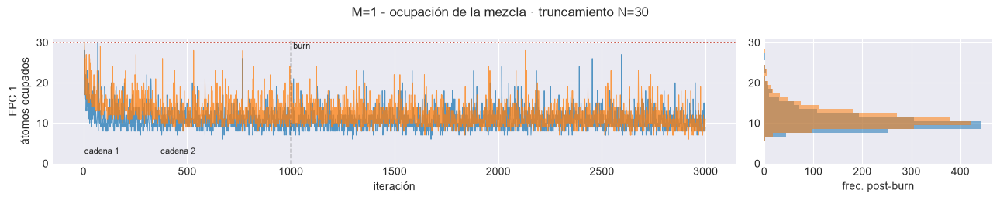

,M,FPC,cadena,media,max,p99,N_trunc,toca_truncamiento
0,1,1,1,10.56,27,19.0,30,False
1,1,1,2,11.40,28,20.0,30,False


OK [M=1] ninguna cadena alcanza N=30: el truncamiento no restringe.


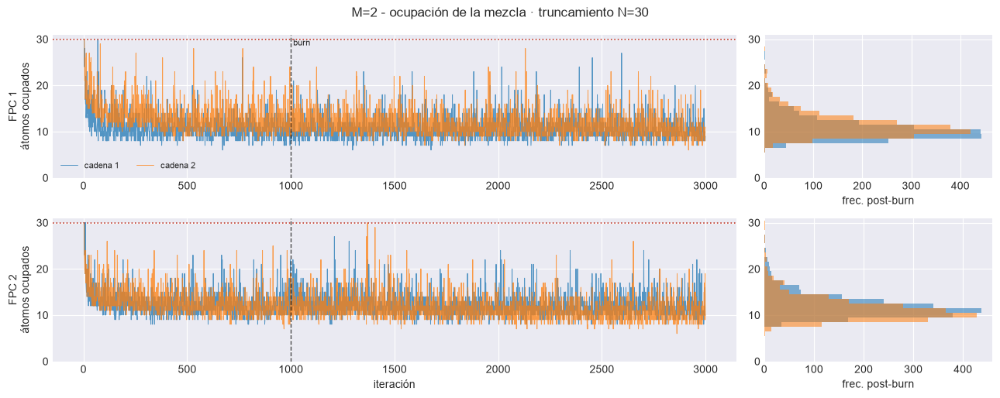

,M,FPC,cadena,media,max,p99,N_trunc,toca_truncamiento
0,2,1,1,10.56,27,19.0,30,False
1,2,1,2,11.40,28,20.0,30,False
2,2,2,1,11.95,27,21.0,30,False
3,2,2,2,11.28,30,20.0,30,True


! [M=2] alguna cadena alcanza N: el truncamiento está mordiendo. Subir mcmc_config['N'].


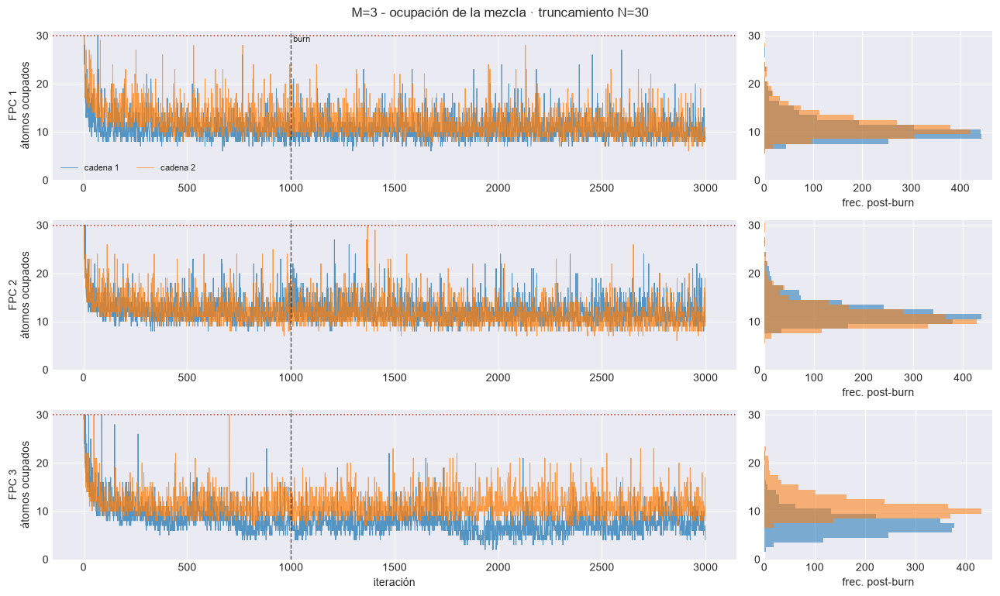

,M,FPC,cadena,media,max,p99,N_trunc,toca_truncamiento
0,3,1,1,10.56,27,19.0,30,False
1,3,1,2,11.40,28,20.0,30,False
2,3,2,1,11.95,27,21.0,30,False
3,3,2,2,11.28,30,20.0,30,True
4,3,3,1,7.39,22,14.0,30,False
5,3,3,2,11.11,23,20.0,30,False


! [M=3] alguna cadena alcanza N: el truncamiento está mordiendo. Subir mcmc_config['N'].


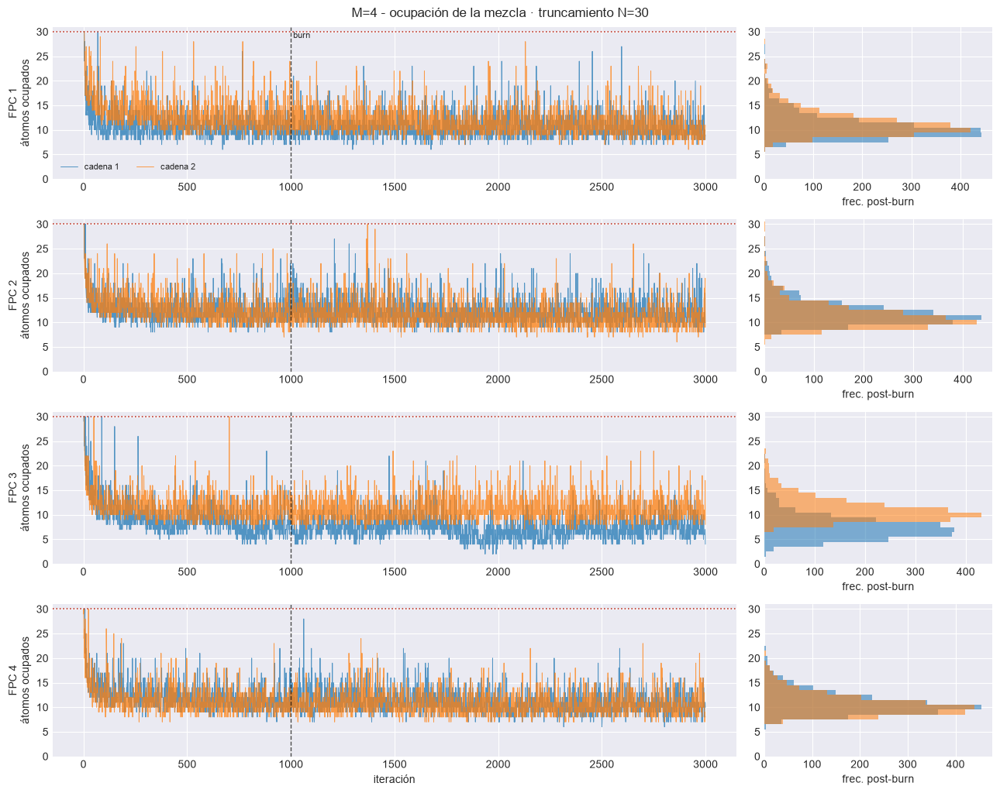

,M,FPC,cadena,media,max,p99,N_trunc,toca_truncamiento
0,4,1,1,10.56,27,19.0,30,False
1,4,1,2,11.40,28,20.0,30,False
2,4,2,1,11.95,27,21.0,30,False
3,4,2,2,11.28,30,20.0,30,True
4,4,3,1,7.39,22,14.0,30,False
5,4,3,2,11.11,23,20.0,30,False
6,4,4,1,10.89,28,18.0,30,False
7,4,4,2,10.59,24,18.0,30,False


! [M=4] alguna cadena alcanza N: el truncamiento está mordiendo. Subir mcmc_config['N'].


In [8]:
for M in M_OK:
    e = EST[M]
    ci, n_comp = e["component_idx"], e["n_components"]
    N_ATOMOS, BURN = e["n_atomos"], e["burn"]

    fig, axes = plt.subplots(n_comp, 2, figsize=(13, 2.6 * n_comp),
                             squeeze=False, gridspec_kw={"width_ratios": [3, 1]})
    resumen_ocupacion = []

    for k in range(n_comp):
        ax_tr, ax_hi = axes[k]
        for c in sorted(e["models_chains"][k]):
            n1 = e["models_chains"][k][c].traces["N1out"]
            ax_tr.plot(np.arange(len(n1)), n1, lw=0.7, alpha=0.75,
                       label=f"cadena {c+1}")
            ax_hi.hist(n1[BURN:], bins=np.arange(0.5, N_ATOMOS + 1.5), alpha=0.55,
                       orientation="horizontal")
            post = n1[BURN:]
            resumen_ocupacion.append({
                "M": M, "FPC": ci[k] + 1, "cadena": c + 1,
                "media": post.mean(), "max": int(post.max()),
                "p99": float(np.quantile(post, 0.99)), "N_trunc": N_ATOMOS,
                "toca_truncamiento": bool(post.max() >= N_ATOMOS),
            })
        ax_tr.axvline(BURN, color="k", ls="--", lw=1, alpha=0.7)
        ax_tr.axhline(N_ATOMOS, color="#c0392b", ls=":", lw=1.2)
        ax_tr.set_ylabel(f"FPC {ci[k]+1}\nátomos ocupados")
        ax_tr.set_ylim(0, N_ATOMOS + 1)
        ax_hi.set_ylim(0, N_ATOMOS + 1)
        ax_hi.set_xlabel("frec. post-burn")
        if k == 0:
            ax_tr.legend(fontsize=8, ncol=3)
            ax_tr.text(BURN, N_ATOMOS, " burn", fontsize=8, va="top")
    axes[-1, 0].set_xlabel("iteración")
    fig.suptitle(f"M={M} - ocupación de la mezcla · truncamiento N={N_ATOMOS}",
                 fontsize=12)
    fig.tight_layout()
    fig.savefig(e["paths"]["out_report"] / "41_ocupacion_mezcla.png",
                dpi=150, bbox_inches="tight")
    plt.show()

    ocup_df = pd.DataFrame(resumen_ocupacion)
    e["ocup_df"] = ocup_df
    display(ocup_df.style.format({"media": "{:.2f}", "p99": "{:.1f}"})
            .set_caption(f"M={M} - átomos ocupados post-calentamiento"))
    if ocup_df["toca_truncamiento"].any():
        print(f"! [M={M}] alguna cadena alcanza N: el truncamiento está "
              "mordiendo. Subir mcmc_config['N'].")
    else:
        print(f"OK [M={M}] ninguna cadena alcanza N={N_ATOMOS}: el truncamiento "
              "no restringe.")

### 4.1 Gating: $\psi$, $\alpha$, $\Gamma$

Diagnóstico de los parámetros de los pesos $\pi_h(x)$. Las variables son promedios ponderados por el peso medio de cada átomo, $\bar w_h=\frac1n\sum_i\pi_h(x_i)$, para que no dependan del etiquetado de la mezcla.

- **átomos ef. global / por punto:** $1/\sum_h\bar w_h^2$ y $\frac1n\sum_i 1/\sum_h\pi_h(x_i)^2$.
- **señal de gating:** global menos por punto. Vale ≈ 0 si los pesos son los mismos en todo $x$.
- **sd del argumento:** dispersión en $i$ de $\alpha_h-\sum_j\psi_{hj}|x_{ij}-\Gamma_{hj}|$, contra el `sd_gate_objetivo` del prior.
- **alpha, psi_j, Gamma_j:** promedios ponderados sobre los $N-1$ palos.

R-hat, ESS y Geweke salen de `diagnostico_variable`.

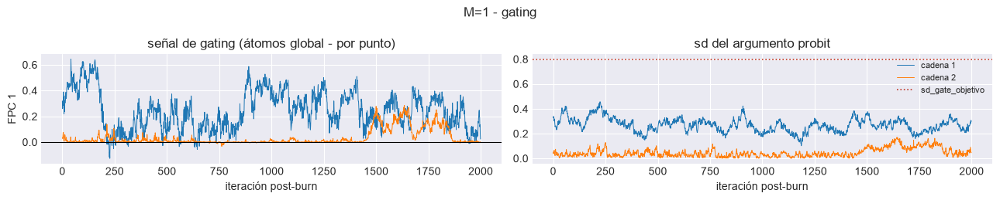

,M,FPC,variable,media_c1,media_c2,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,1,1,atomos_global,3.282,3.525,2,2000,9,17,3.632,1.105,False
1,1,1,atomos_punto,3.039,3.491,2,2000,7,18,3.542,1.408,False
2,1,1,senal_gating,0.243,0.034,2,2000,8,14,4.818,1.664,False
3,1,1,sd_argumento,0.268,0.046,2,2000,9,19,3.039,3.540,False
4,1,1,alpha,0.442,0.022,2,2000,5,15,2.382,2.161,False
5,1,1,psi_0,0.648,0.130,2,2000,11,21,2.987,3.379,False
6,1,1,psi_1,0.000,0.000,2,2000,1432,1583,3.459,1.000,False
7,1,1,psi_2,0.000,0.000,2,2000,1087,1418,0.963,1.000,True
8,1,1,psi_3,0.000,0.000,2,2000,808,1026,2.176,1.000,False
9,1,1,Gamma_0,0.055,-0.376,2,2000,6,16,6.284,1.416,False


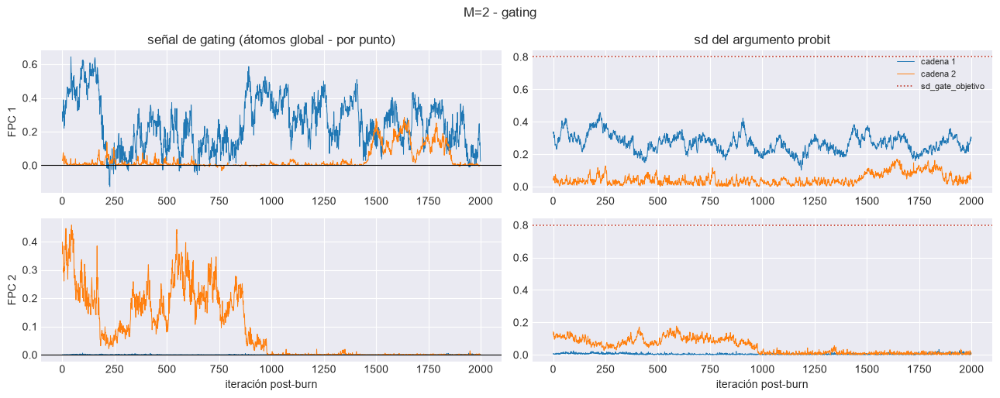

,M,FPC,variable,media_c1,media_c2,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,2,1,atomos_global,3.282,3.525,2,2000,9,17,3.632,1.105,False
1,2,1,atomos_punto,3.039,3.491,2,2000,7,18,3.542,1.408,False
2,2,1,senal_gating,0.243,0.034,2,2000,8,14,4.818,1.664,False
3,2,1,sd_argumento,0.268,0.046,2,2000,9,19,3.039,3.540,False
4,2,1,alpha,0.442,0.022,2,2000,5,15,2.382,2.161,False
5,2,1,psi_0,0.648,0.130,2,2000,11,21,2.987,3.379,False
6,2,1,psi_1,0.000,0.000,2,2000,1432,1583,3.459,1.000,False
7,2,1,psi_2,0.000,0.000,2,2000,1087,1418,0.963,1.000,True
8,2,1,psi_3,0.000,0.000,2,2000,808,1026,2.176,1.000,False
9,2,1,Gamma_0,0.055,-0.376,2,2000,6,16,6.284,1.416,False


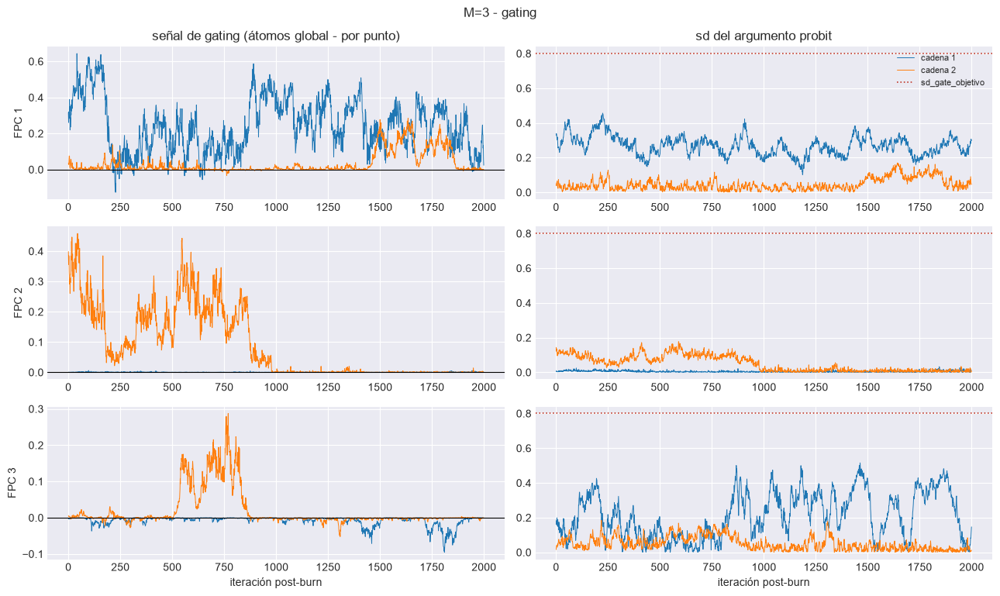

,M,FPC,variable,media_c1,media_c2,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,3,1,atomos_global,3.282,3.525,2,2000,9,17,3.632,1.105,False
1,3,1,atomos_punto,3.039,3.491,2,2000,7,18,3.542,1.408,False
2,3,1,senal_gating,0.243,0.034,2,2000,8,14,4.818,1.664,False
3,3,1,sd_argumento,0.268,0.046,2,2000,9,19,3.039,3.540,False
4,3,1,alpha,0.442,0.022,2,2000,5,15,2.382,2.161,False
5,3,1,psi_0,0.648,0.130,2,2000,11,21,2.987,3.379,False
6,3,1,psi_1,0.000,0.000,2,2000,1432,1583,3.459,1.000,False
7,3,1,psi_2,0.000,0.000,2,2000,1087,1418,0.963,1.000,True
8,3,1,psi_3,0.000,0.000,2,2000,808,1026,2.176,1.000,False
9,3,1,Gamma_0,0.055,-0.376,2,2000,6,16,6.284,1.416,False


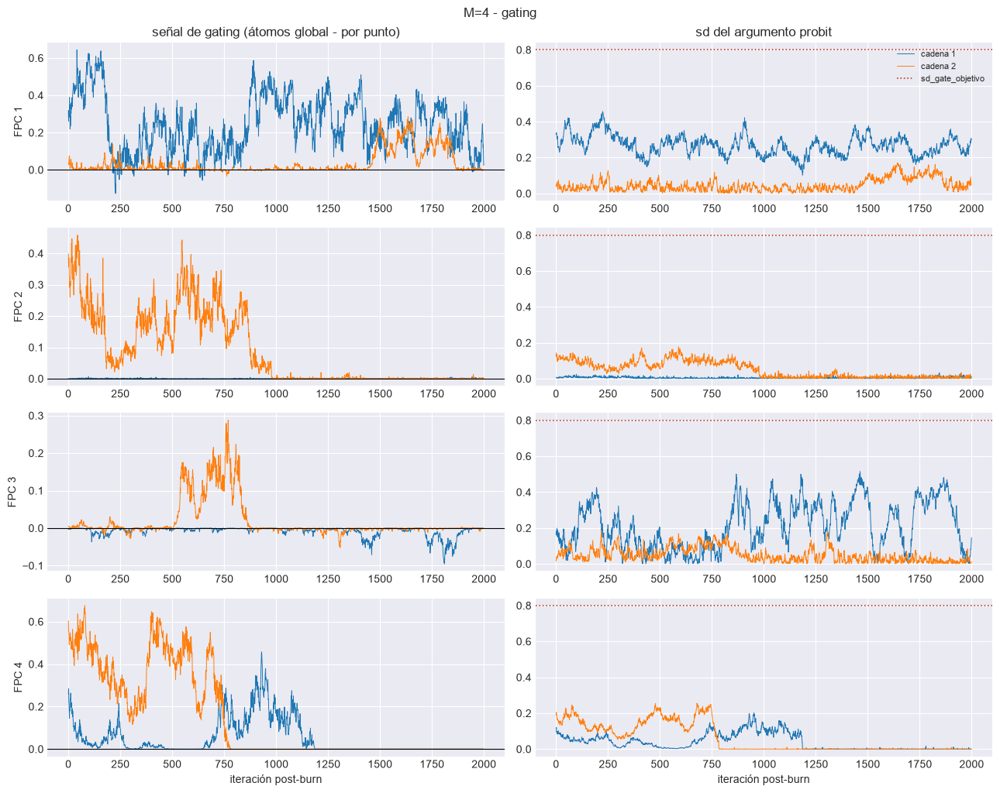

,M,FPC,variable,media_c1,media_c2,n_cadenas,n_post,ess_min,ess_mean,geweke_max,rhat,converge
0,4,1,atomos_global,3.282,3.525,2,2000,9,17,3.632,1.105,False
1,4,1,atomos_punto,3.039,3.491,2,2000,7,18,3.542,1.408,False
2,4,1,senal_gating,0.243,0.034,2,2000,8,14,4.818,1.664,False
3,4,1,sd_argumento,0.268,0.046,2,2000,9,19,3.039,3.540,False
4,4,1,alpha,0.442,0.022,2,2000,5,15,2.382,2.161,False
5,4,1,psi_0,0.648,0.130,2,2000,11,21,2.987,3.379,False
6,4,1,psi_1,0.000,0.000,2,2000,1432,1583,3.459,1.000,False
7,4,1,psi_2,0.000,0.000,2,2000,1087,1418,0.963,1.000,True
8,4,1,psi_3,0.000,0.000,2,2000,808,1026,2.176,1.000,False
9,4,1,Gamma_0,0.055,-0.376,2,2000,6,16,6.284,1.416,False


In [9]:
from model_psbp_fd.models.pspb_fd_v3 import pesos_probit


def series_gating(mt, X):
    tr, b = mt.traces, mt.burn
    al, ps, gm = tr["alphahout"][b:], tr["psijhout"][b:], tr["Gammajhout"][b:]
    T, p = al.shape[0], X.shape[1]
    nombres = (["atomos_global", "atomos_punto", "senal_gating", "sd_argumento", "alpha"]
               + [f"psi_{j}" for j in range(p)] + [f"Gamma_{j}" for j in range(p)])
    S = {n: np.empty(T) for n in nombres}
    for t in range(T):
        w = pesos_probit(X, al[t], ps[t], gm[t])
        wbar = w.mean(0)
        s = wbar[:-1].sum()
        u = wbar[:-1] / s if s > 1e-12 else np.full(len(wbar) - 1, 1.0 / (len(wbar) - 1))
        eta = al[t][:, None] - np.sum(ps[t][:, None, :] * np.abs(X[None] - gm[t][:, None, :]), axis=2)
        S["atomos_global"][t] = 1.0 / np.sum(wbar ** 2)
        S["atomos_punto"][t] = np.mean(1.0 / np.sum(w ** 2, axis=1))
        S["sd_argumento"][t] = np.sum(u * eta.std(axis=1))
        S["alpha"][t] = np.sum(u * al[t])
        for j in range(p):
            S[f"psi_{j}"][t] = np.sum(u * ps[t][:, j])
            S[f"Gamma_{j}"][t] = np.sum(u * gm[t][:, j])
    S["senal_gating"] = S["atomos_global"] - S["atomos_punto"]
    return S


_CACHE_GATING = {}

for M in M_OK:
    e = EST[M]
    ci, n_comp = e["component_idx"], e["n_components"]
    filas = []
    fig, axes = plt.subplots(n_comp, 2, figsize=(13, 2.6 * n_comp), squeeze=False)

    for k in range(n_comp):
        X = e["dfs_train"][k].iloc[:, 1:].to_numpy()
        cams = sorted(e["models_chains"][k])
        for c in cams:
            if (ci[k], c) not in _CACHE_GATING:
                _CACHE_GATING[(ci[k], c)] = series_gating(e["models_chains"][k][c], X)
        SER = {c: _CACHE_GATING[(ci[k], c)] for c in cams}
        obj = e["hp_json"].get("escalera", {}).get(str(k), {}).get("sd_gate_objetivo")

        for v in SER[cams[0]]:
            C = np.vstack([SER[c][v] for c in cams])
            fila = {"M": M, "FPC": ci[k] + 1, "variable": v}
            fila.update({f"media_c{c+1}": SER[c][v].mean() for c in cams})
            fila.update(diagnostico_variable(C))
            filas.append(fila)

        for c in cams:
            axes[k, 0].plot(SER[c]["senal_gating"], lw=0.7, label=f"cadena {c+1}")
            axes[k, 1].plot(SER[c]["sd_argumento"], lw=0.7, label=f"cadena {c+1}")
        axes[k, 0].axhline(0, color="k", lw=0.8)
        if obj is not None:
            axes[k, 1].axhline(obj, color="#c0392b", ls=":", lw=1.2, label="sd_gate_objetivo")
        axes[k, 0].set_ylabel(f"FPC {ci[k]+1}")
        if k == 0:
            axes[k, 0].set_title("señal de gating (átomos global - por punto)")
            axes[k, 1].set_title("sd del argumento probit")
            axes[k, 1].legend(fontsize=8)
    axes[-1, 0].set_xlabel("iteración post-burn")
    axes[-1, 1].set_xlabel("iteración post-burn")
    fig.suptitle(f"M={M} - gating", fontsize=12)
    fig.tight_layout()
    fig.savefig(e["paths"]["out_report"] / "49_gating.png", dpi=150, bbox_inches="tight")
    plt.show()

    gat = pd.DataFrame(filas)
    gat.to_csv(e["paths"]["out_report"] / "48_gating_diagnosticos.csv", index=False)
    e["gating_df"] = gat
    display(gat.style.format({c: "{:.3f}" for c in gat.columns
                              if c.startswith("media_") or c in ("rhat", "geweke_max")}
                             | {"ess_min": "{:.0f}", "ess_mean": "{:.0f}"})
            .set_caption(f"M={M} - gating post-calentamiento"))

## 5. Figuras de convergencia por parámetro

== M=1 ==============================================


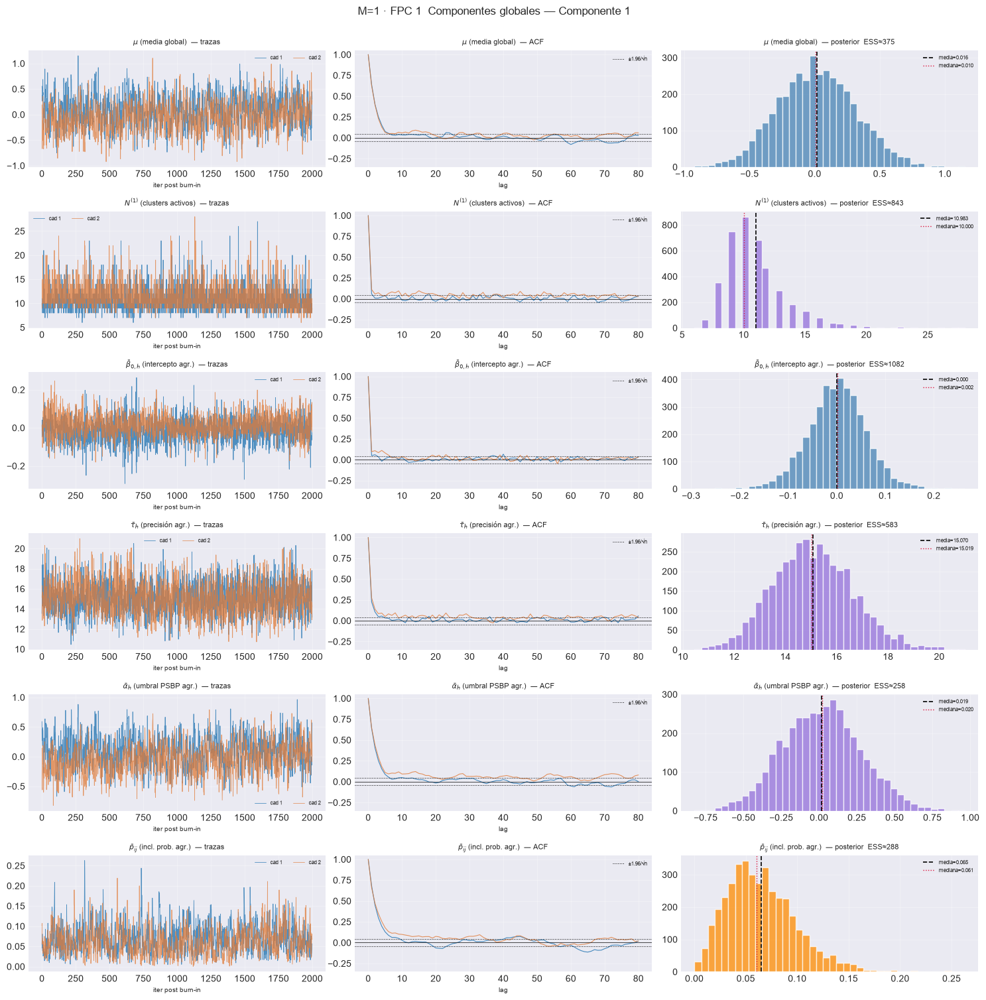

C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_global_components.py:276: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_global_components.py:278: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
c:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\.v_2\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


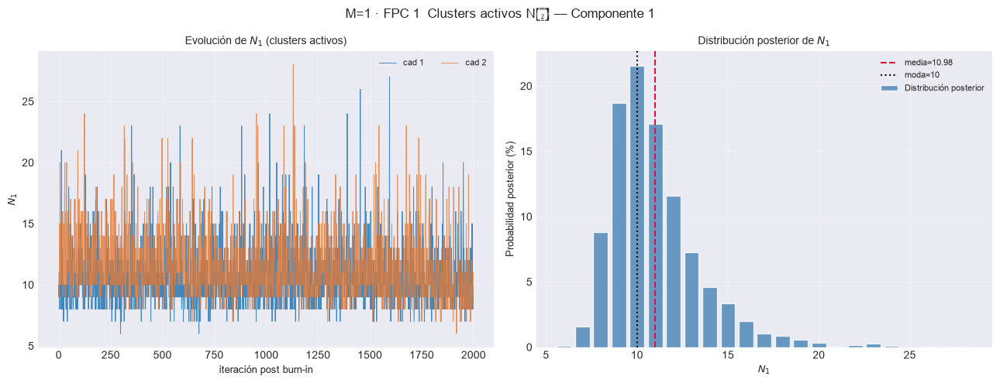

== M=2 ==============================================


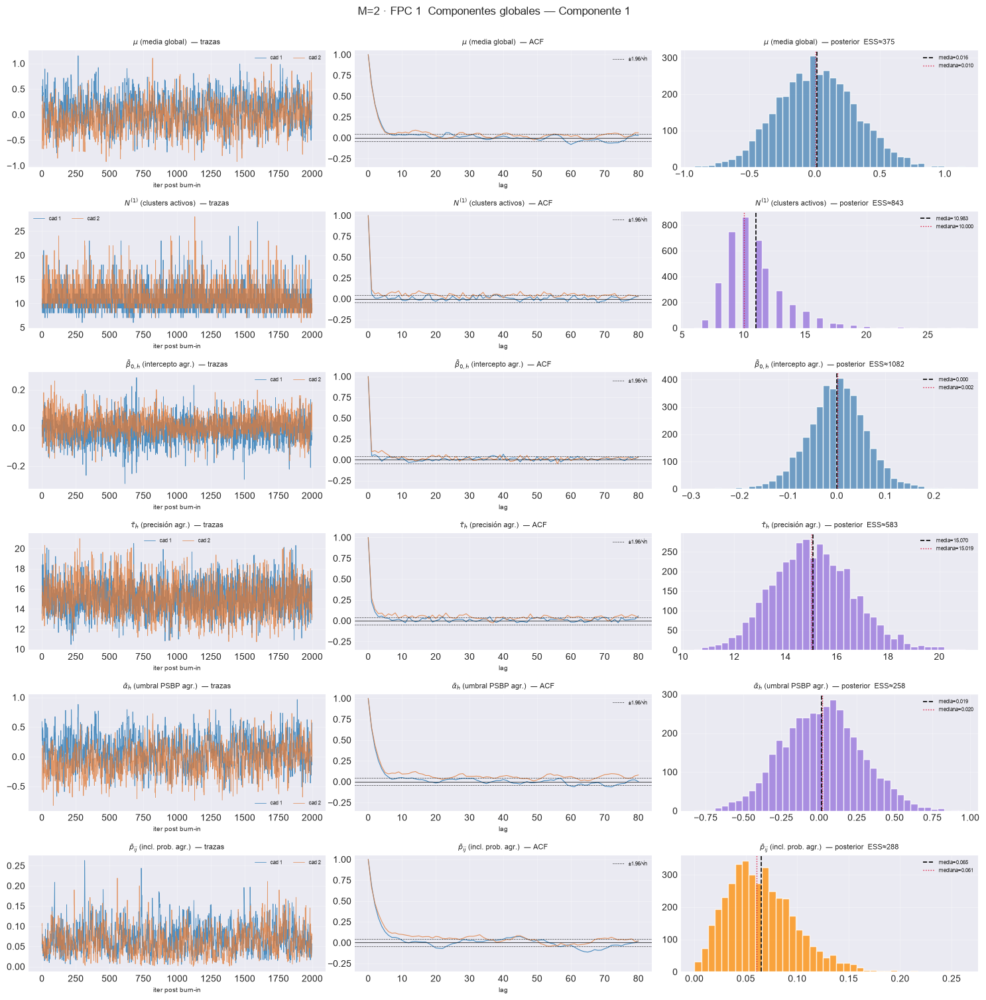

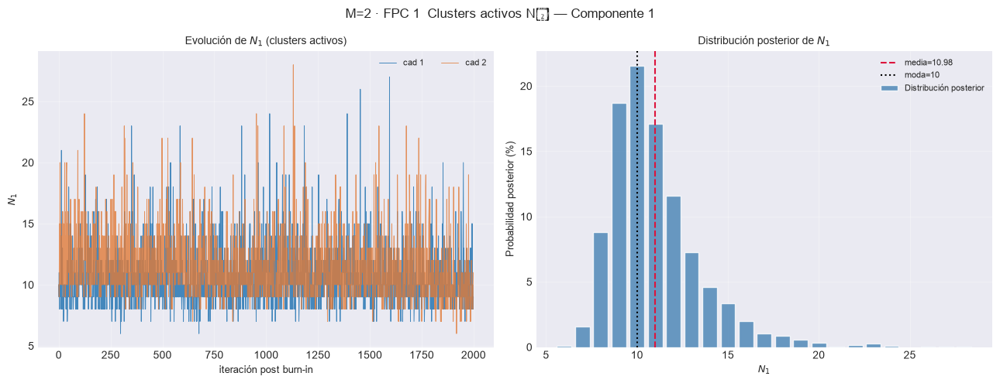

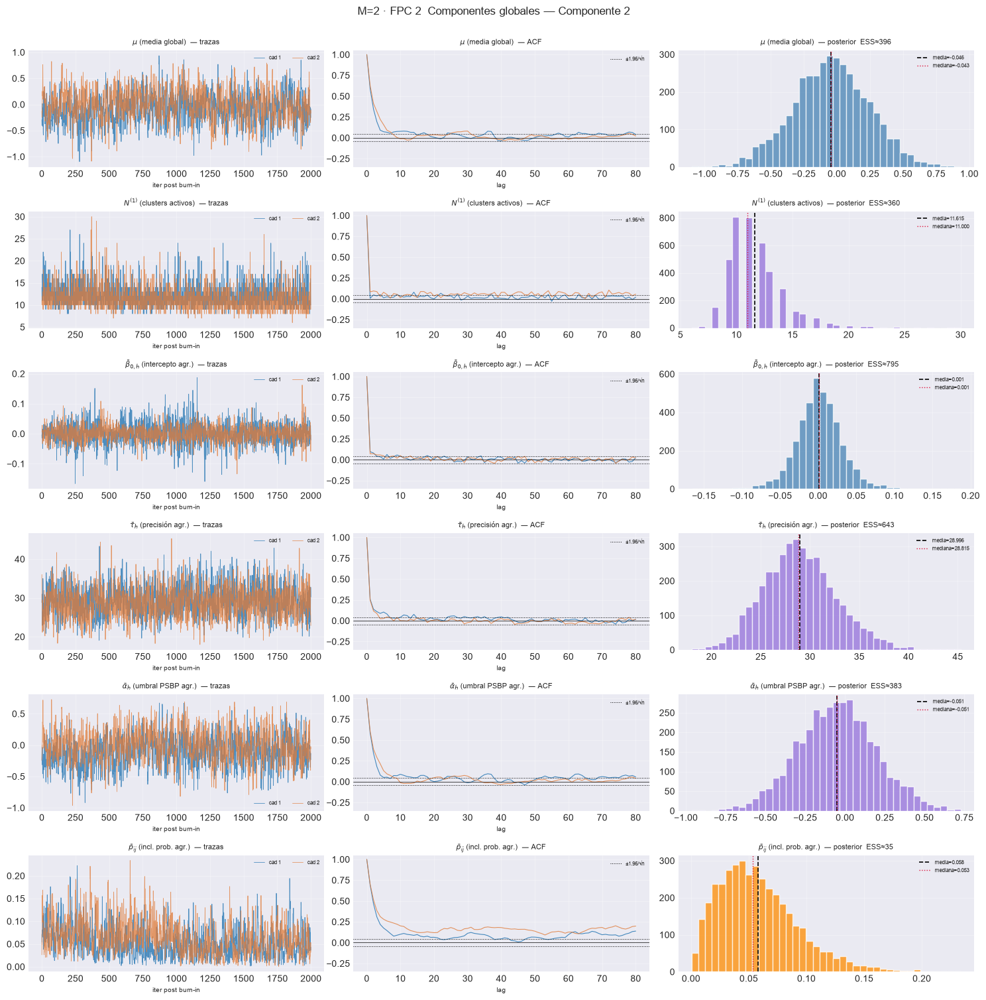

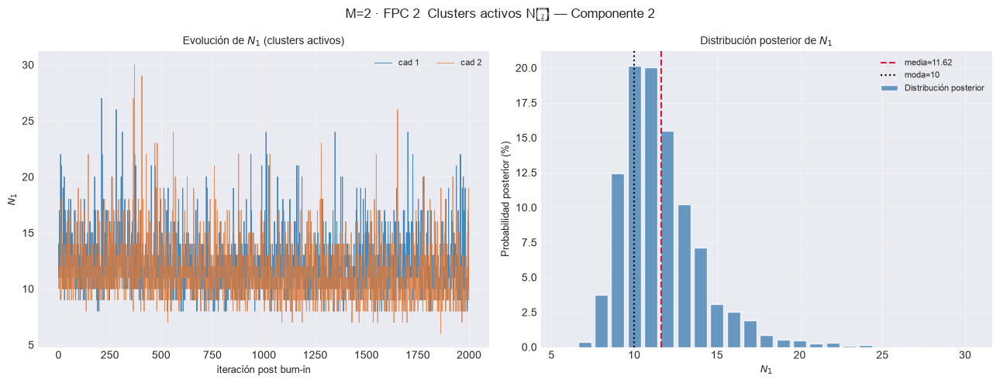

== M=3 ==============================================


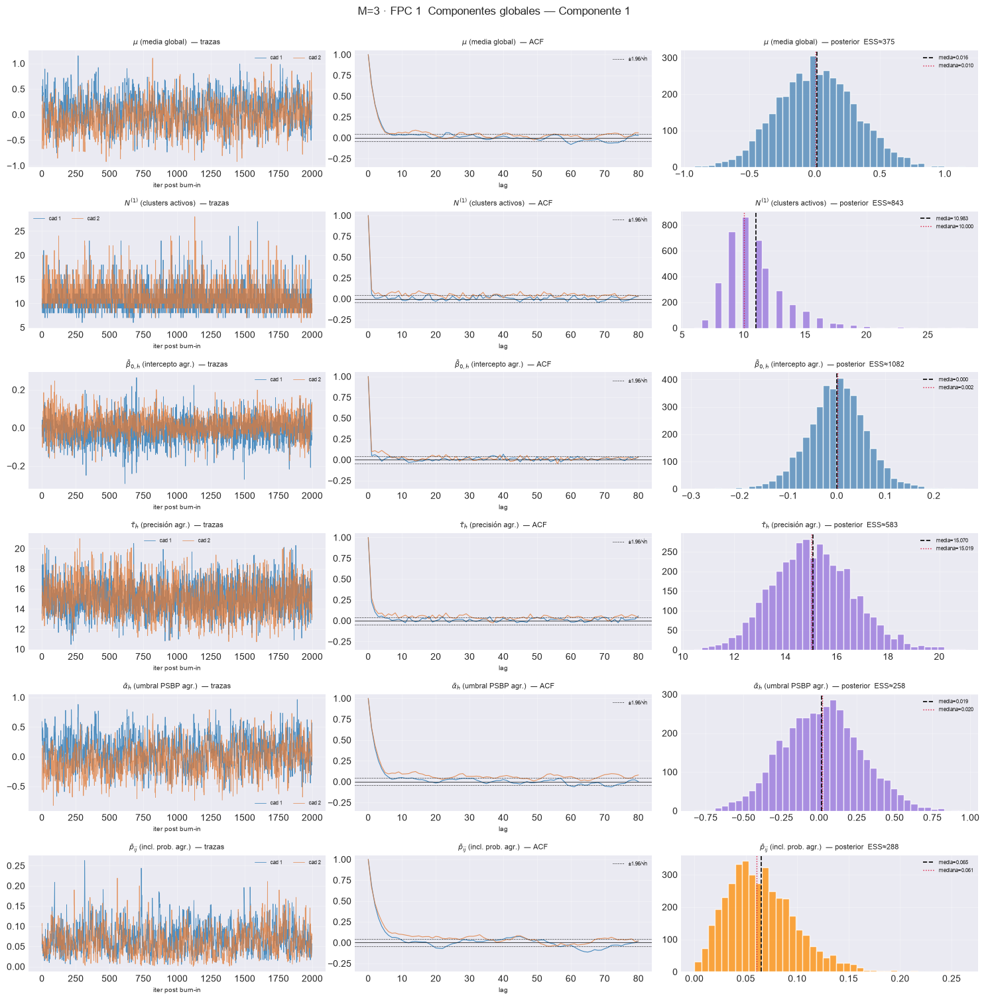

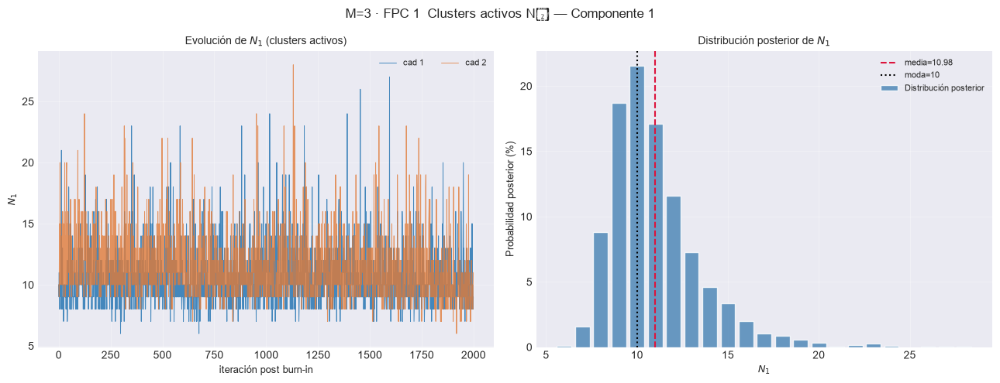

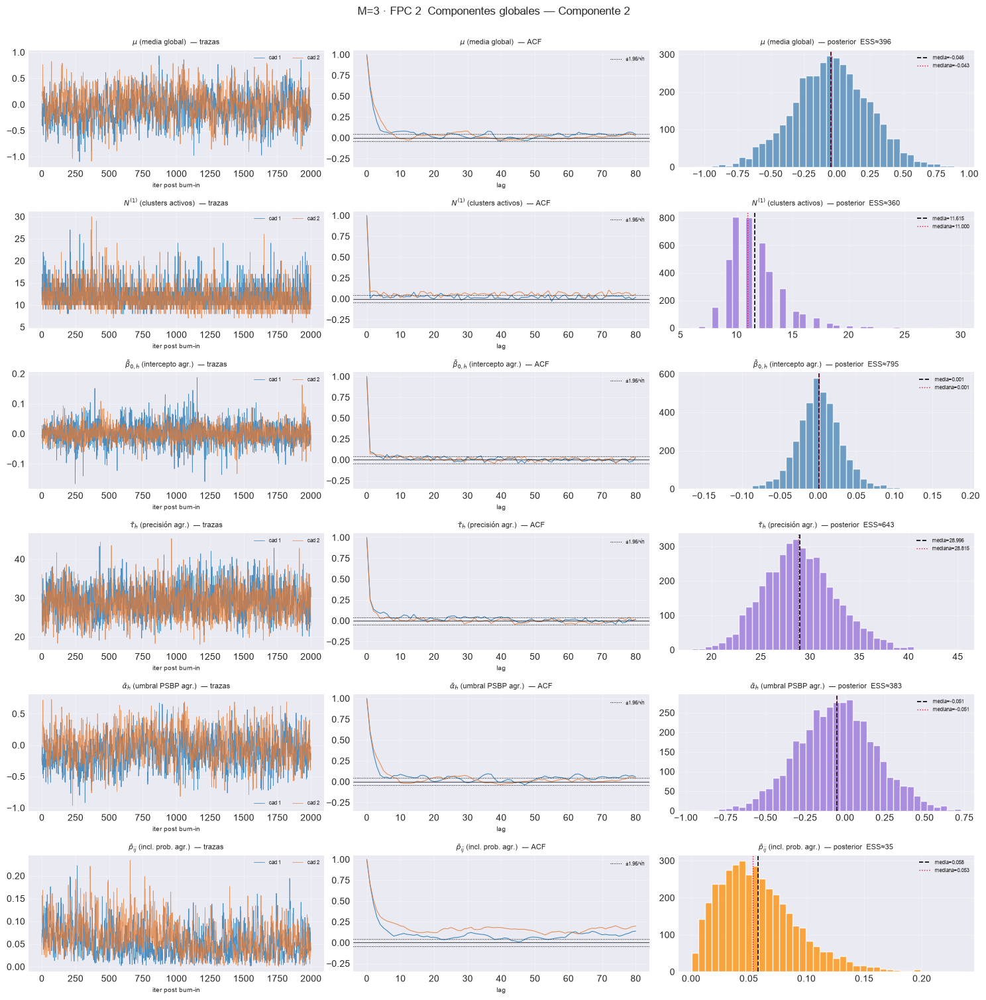

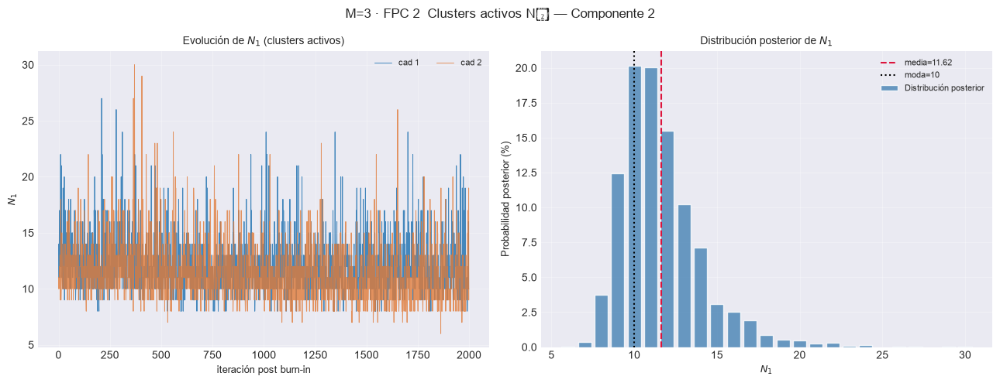

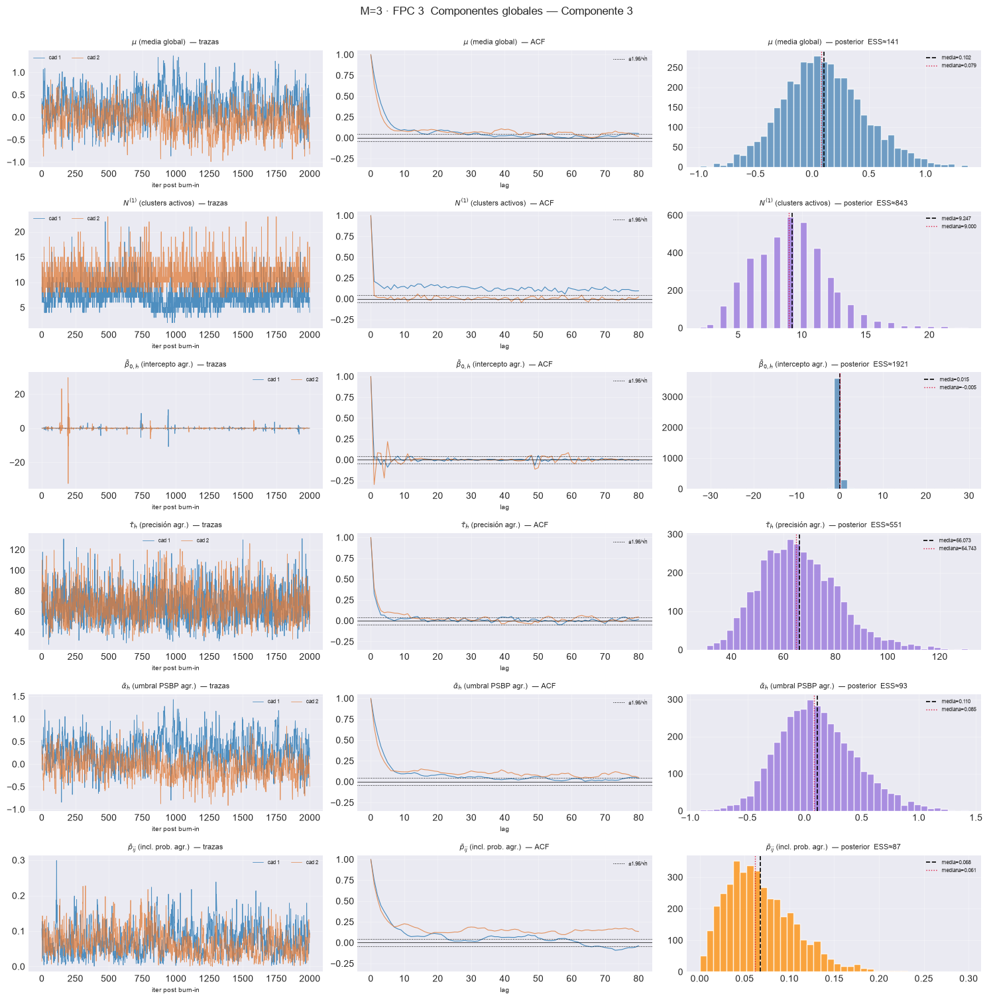

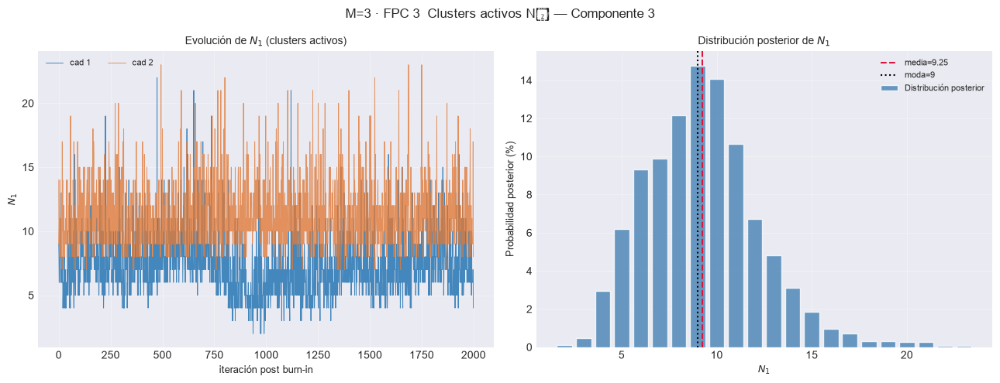

== M=4 ==============================================


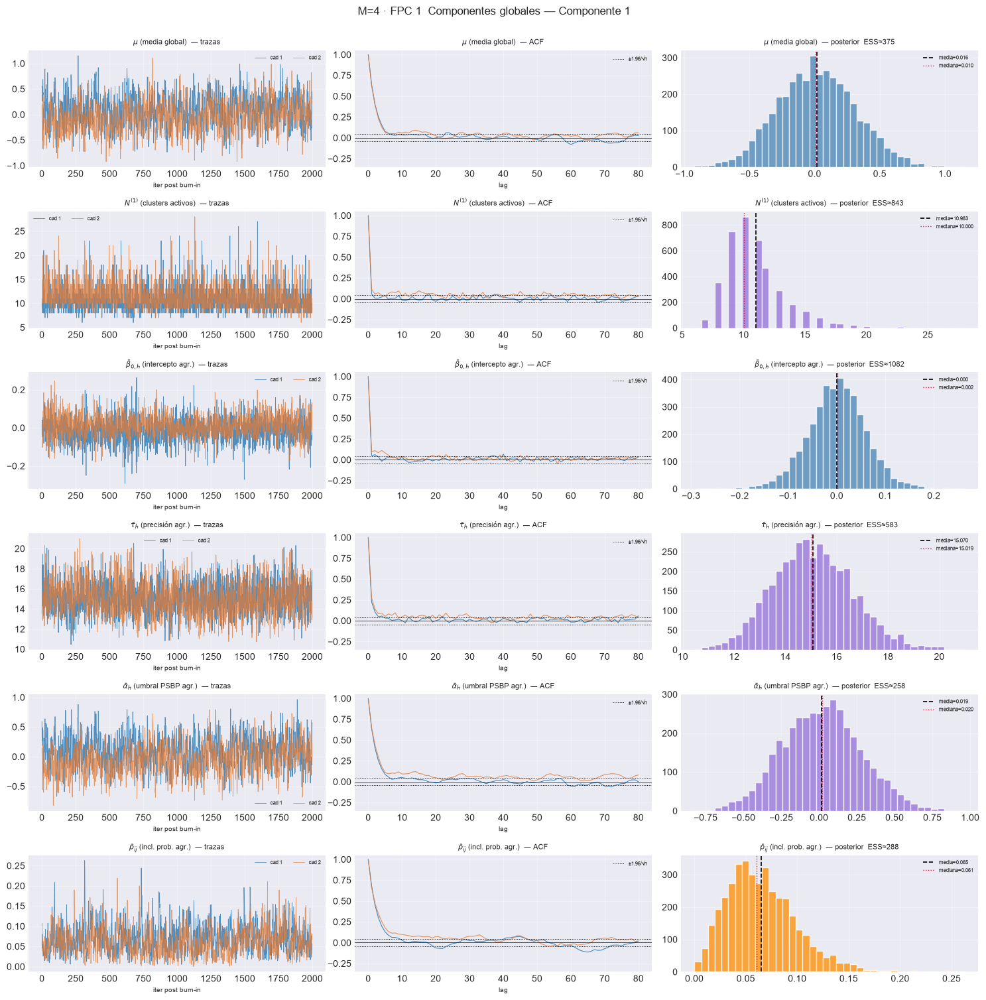

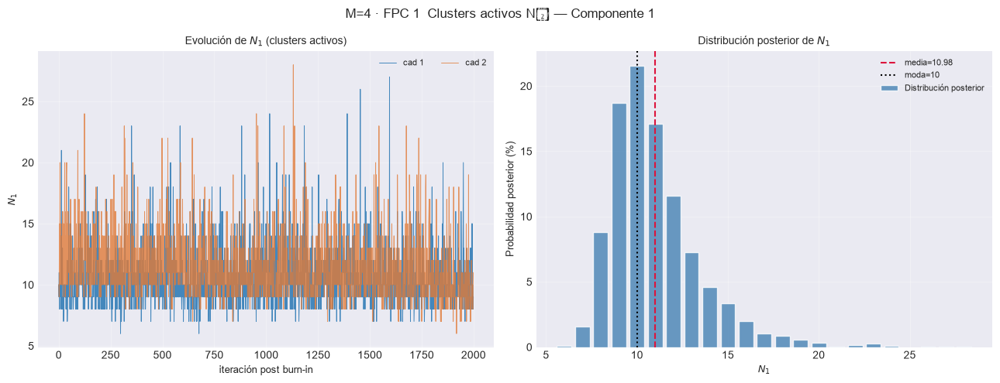

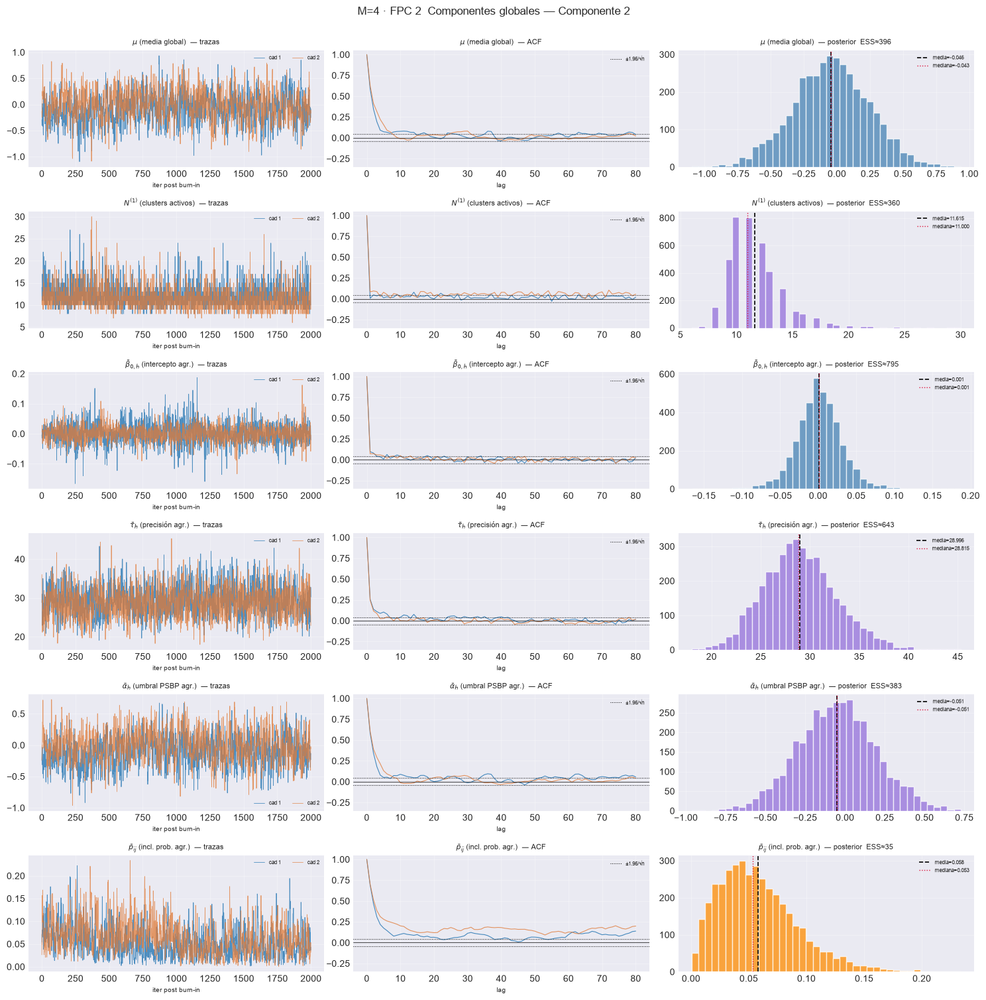

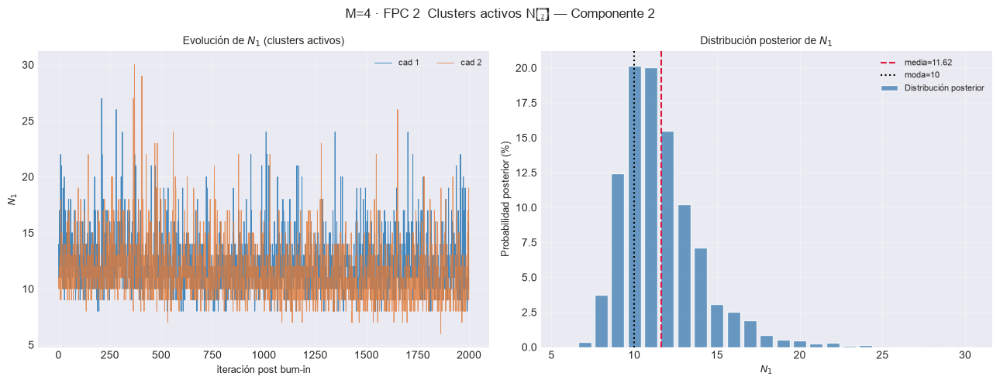

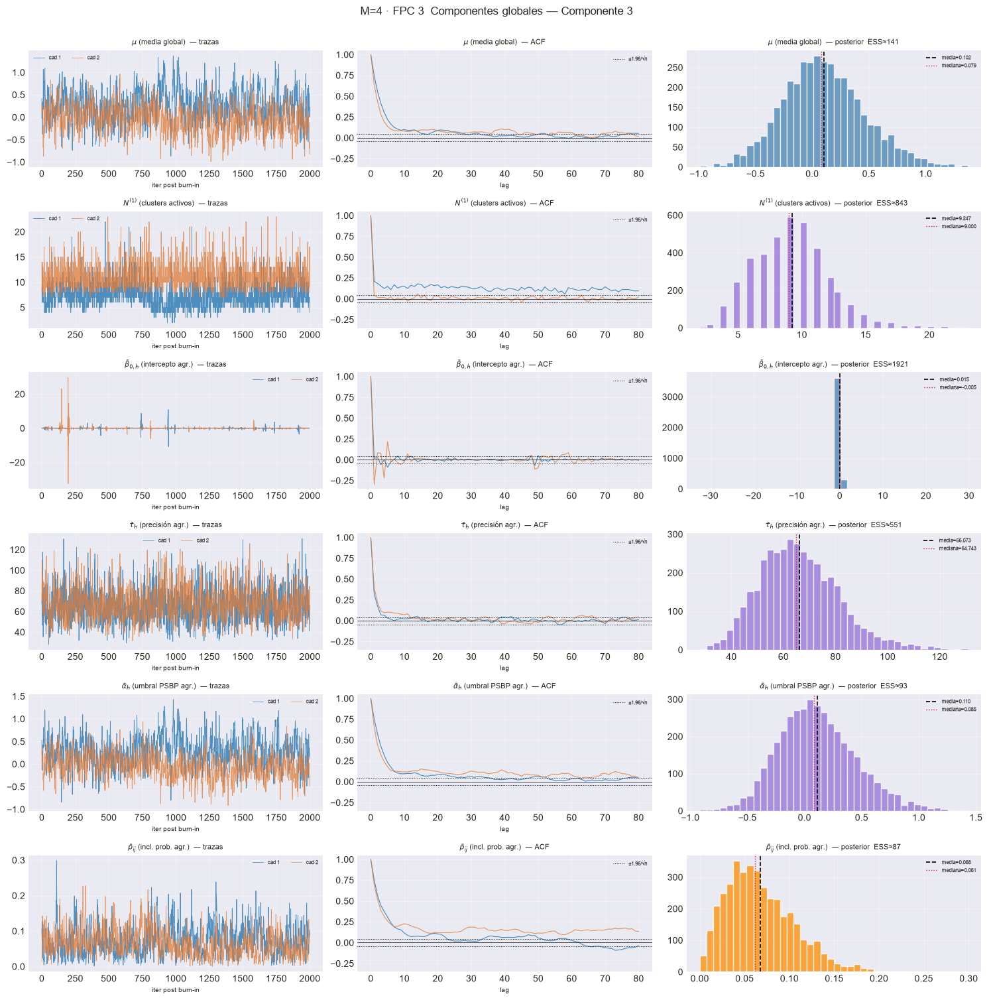

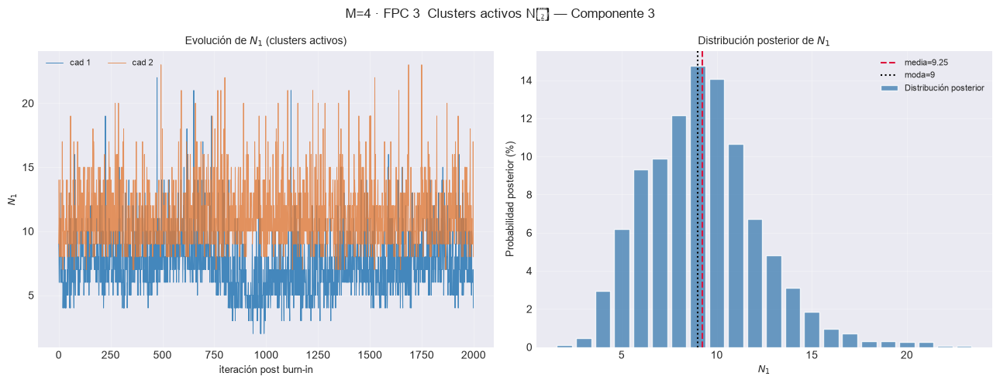

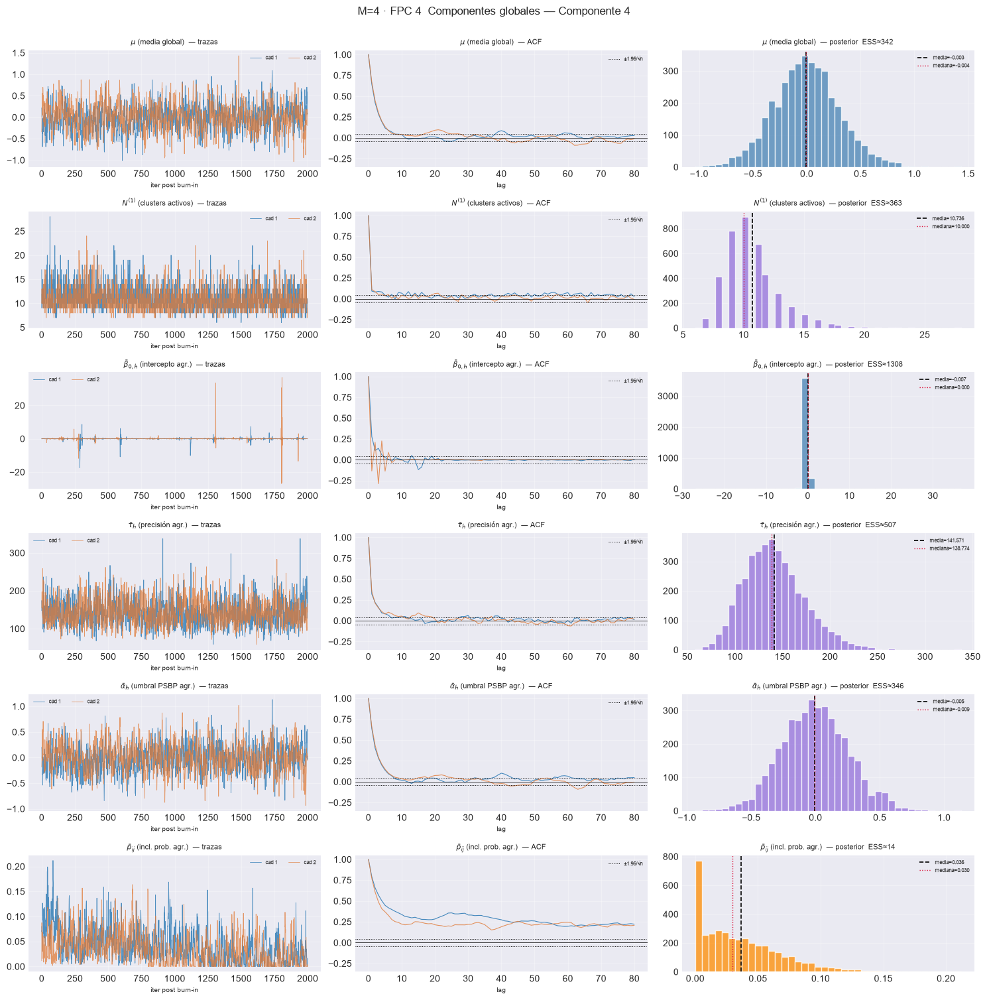

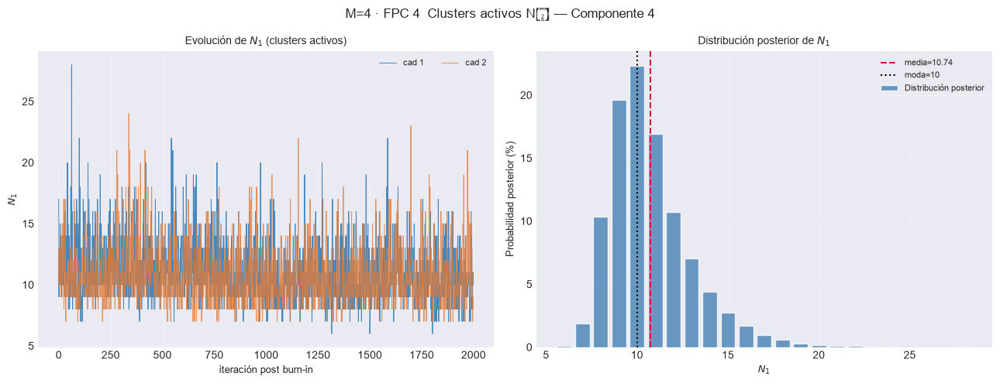

In [10]:
for M in M_OK:
    e = EST[M]
    print(f"== M={M} " + "=" * 46)
    for k in e["models_chains"]:
        fpc = e["component_idx"][k] + 1
        plot_global_components(
            e["models_chains"], k, e["burn"], e["n_iter"],
            title_prefix=f"M={M} · FPC {fpc}",
            save_path=str(e["paths"]["out_report"] / f"42_global_k{fpc}.png"))
        plt.show()
        plot_active_clusters(
            e["models_chains"], k, e["burn"], e["n_iter"],
            title_prefix=f"M={M} · FPC {fpc}",
            save_path=str(e["paths"]["out_report"] / f"43_clusters_k{fpc}.png"))
        plt.show()

== M=1 ==============================================
[plot_convergence_bj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_1_lag1  rhat=1.009  ess_min=1149  |G|=3.40  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=1020  |G|=2.29  ✗
  3/4 (75.0%) t=0.3s eta=0.1s  fpc_1_lag3  rhat=1.000  ess_min=1642  |G|=0.57  ✓
  4/4 (100.0%) t=0.4s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=2000  |G|=1.46  ✓


C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:348: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:348: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:350: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:350: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")


[plot_convergence_bj[FPC 1]] listo: 4 pasos en 5.4s  2/4 sin converger


c:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\.v_2\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\.v_2\Lib\site-packages\IPython\core\pylabtools.py:158: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


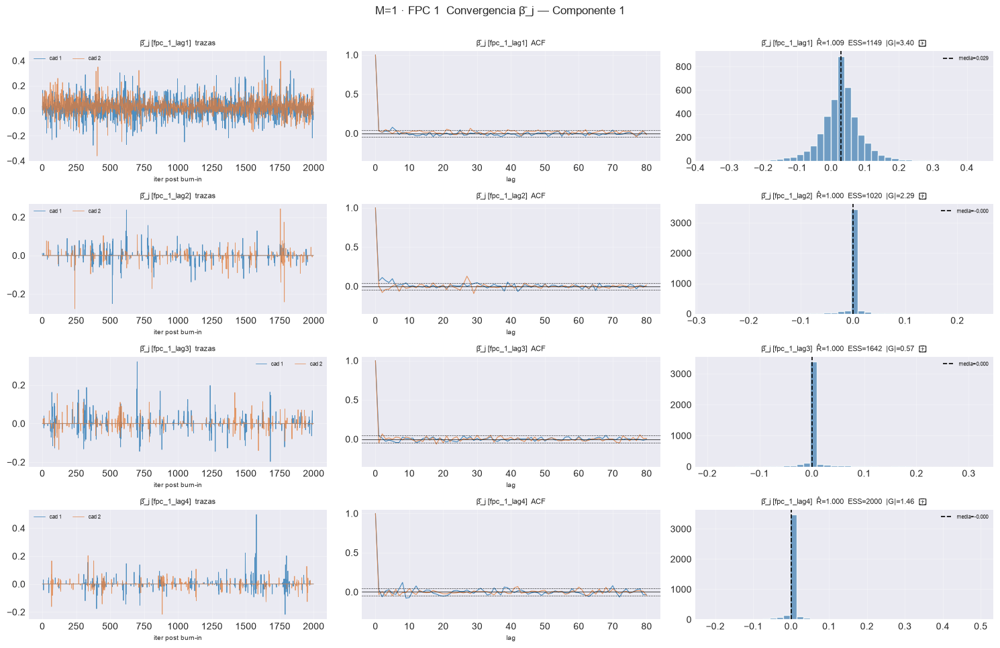

[plot_convergence_pj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_1_lag1  rhat=1.021  ess_min=95  |G|=1.62  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=208  |G|=2.52  ✗
  3/4 (75.0%) t=0.3s eta=0.1s  fpc_1_lag3  rhat=1.001  ess_min=268  |G|=0.78  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=182  |G|=2.41  ✗


C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:447: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:447: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:449: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:449: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")


[plot_convergence_pj[FPC 1]] listo: 4 pasos en 4.2s  3/4 sin converger


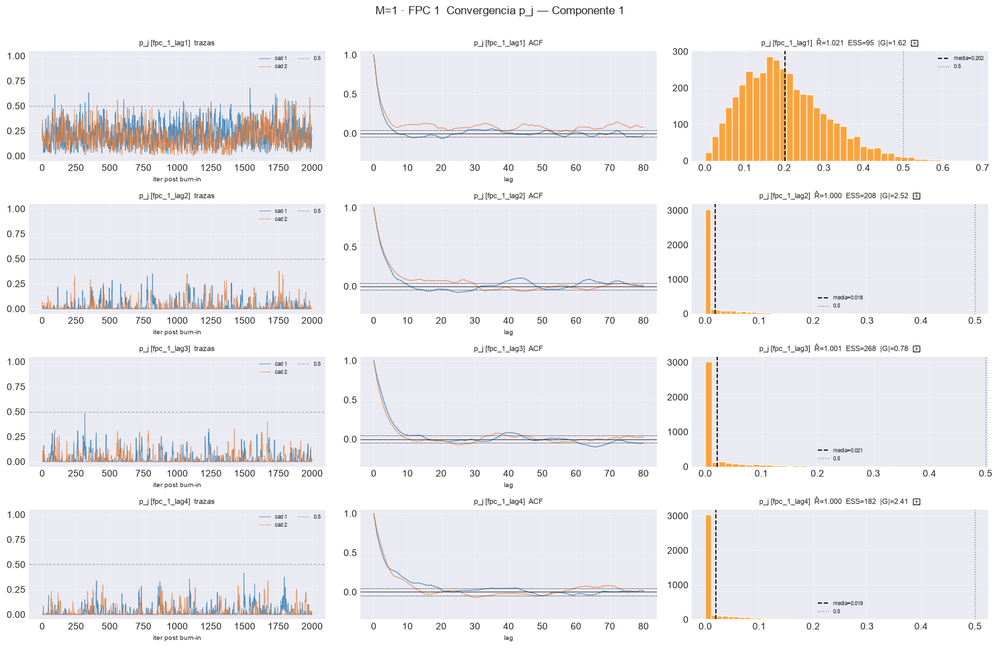

== M=2 ==============================================
[plot_convergence_bj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_1_lag1  rhat=1.009  ess_min=1149  |G|=3.40  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=1020  |G|=2.29  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.000  ess_min=1642  |G|=0.57  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=2000  |G|=1.46  ✓
[plot_convergence_bj[FPC 1]] listo: 4 pasos en 3.9s  2/4 sin converger


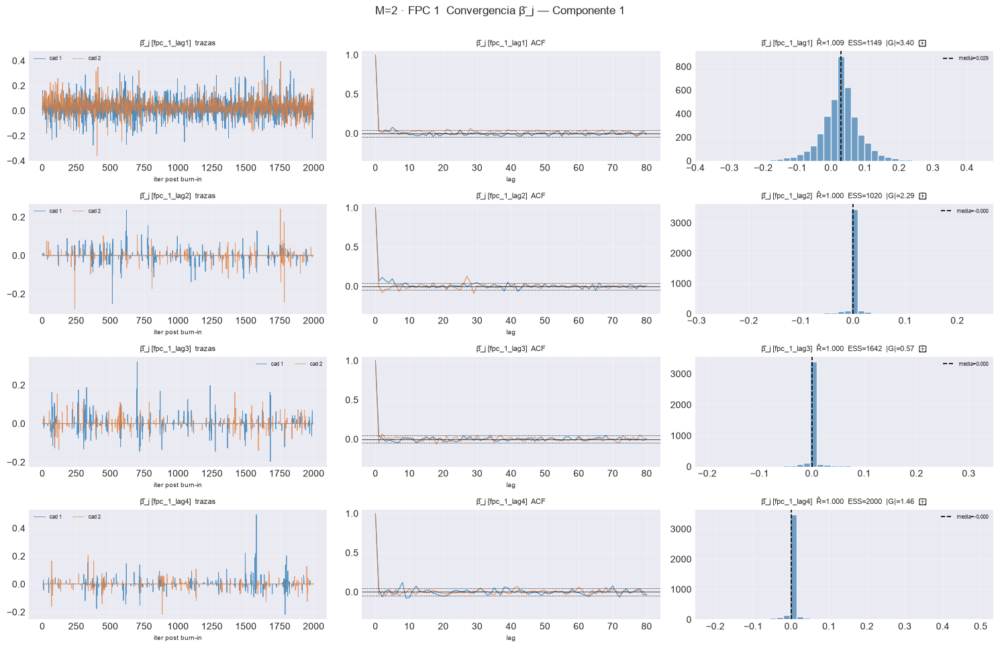

[plot_convergence_pj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_1_lag1  rhat=1.021  ess_min=95  |G|=1.62  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=208  |G|=2.52  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.001  ess_min=268  |G|=0.78  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=182  |G|=2.41  ✗
[plot_convergence_pj[FPC 1]] listo: 4 pasos en 4.1s  3/4 sin converger


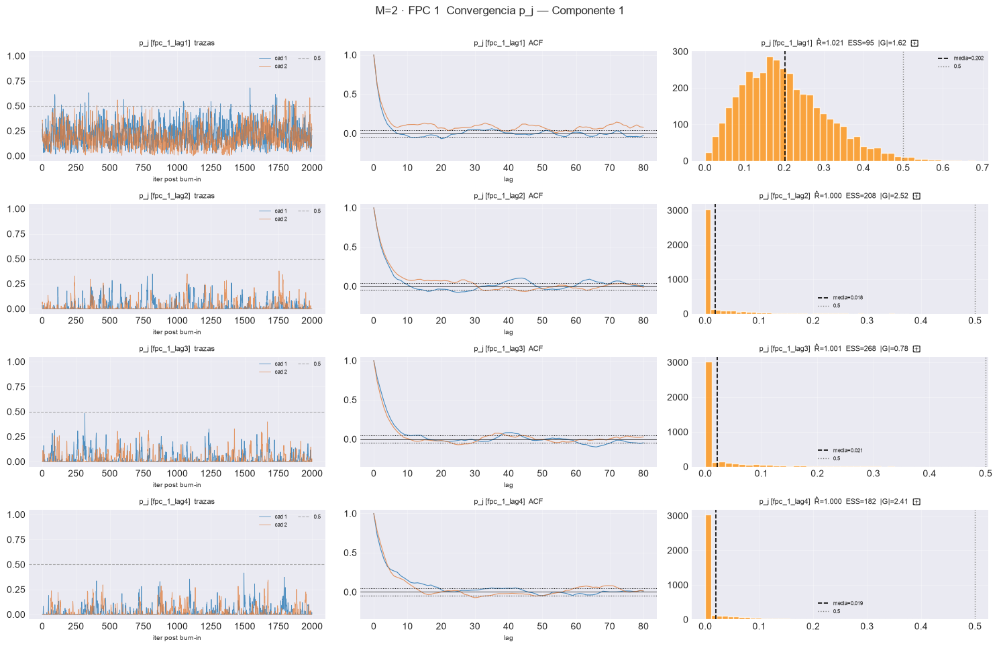

[plot_convergence_bj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_2_lag1  rhat=1.019  ess_min=1683  |G|=1.05  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_2_lag2  rhat=1.001  ess_min=2000  |G|=0.50  ✓
  3/4 (75.0%) t=0.3s eta=0.1s  fpc_2_lag3  rhat=1.002  ess_min=1198  |G|=2.17  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.002  ess_min=1789  |G|=1.20  ✓
[plot_convergence_bj[FPC 2]] listo: 4 pasos en 4.9s  1/4 sin converger


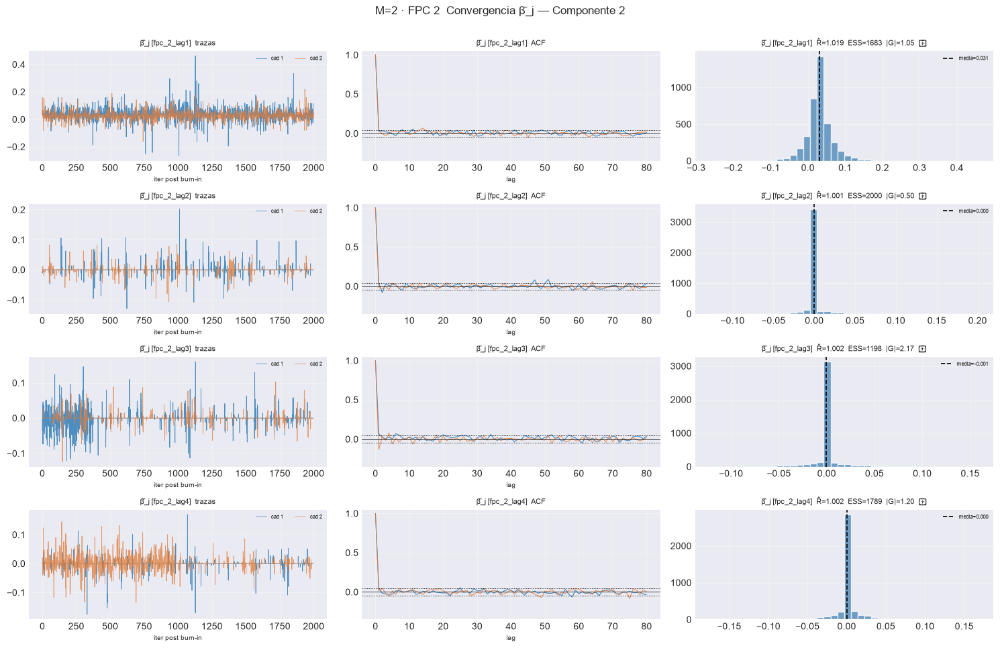

[plot_convergence_pj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_2_lag1  rhat=1.000  ess_min=426  |G|=2.11  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_2_lag2  rhat=1.003  ess_min=181  |G|=1.06  ✓
  3/4 (75.0%) t=0.3s eta=0.1s  fpc_2_lag3  rhat=1.029  ess_min=14  |G|=11.35  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.170  ess_min=8  |G|=9.74  ✗
[plot_convergence_pj[FPC 2]] listo: 4 pasos en 5.0s  3/4 sin converger


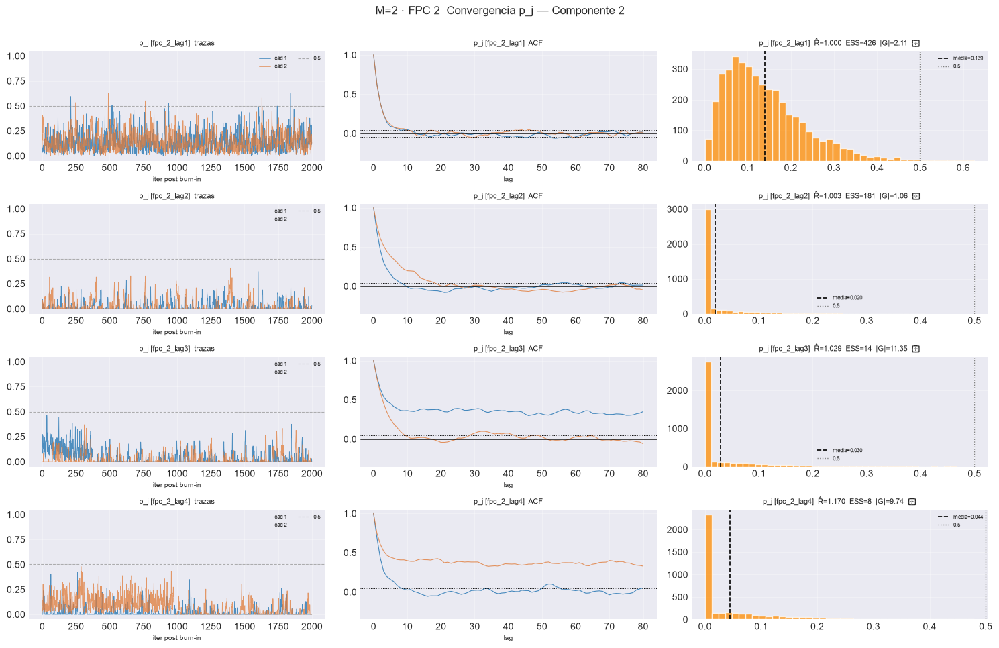

== M=3 ==============================================
[plot_convergence_bj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_1_lag1  rhat=1.009  ess_min=1149  |G|=3.40  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=1020  |G|=2.29  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.000  ess_min=1642  |G|=0.57  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=2000  |G|=1.46  ✓
[plot_convergence_bj[FPC 1]] listo: 4 pasos en 4.0s  2/4 sin converger


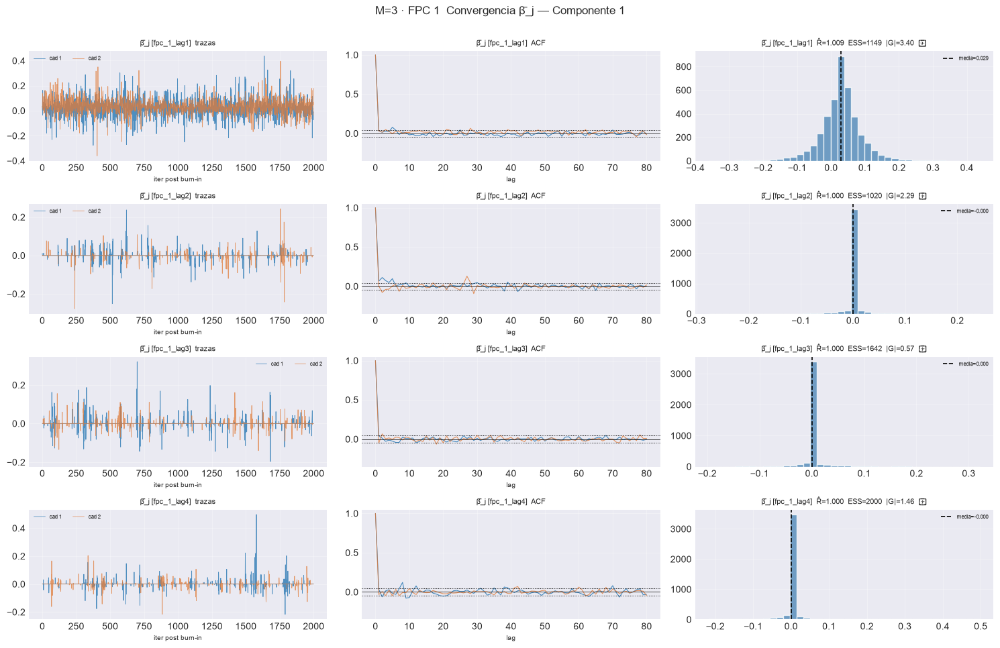

[plot_convergence_pj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_1_lag1  rhat=1.021  ess_min=95  |G|=1.62  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_1_lag2  rhat=1.000  ess_min=208  |G|=2.52  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.001  ess_min=268  |G|=0.78  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=182  |G|=2.41  ✗
[plot_convergence_pj[FPC 1]] listo: 4 pasos en 4.5s  3/4 sin converger


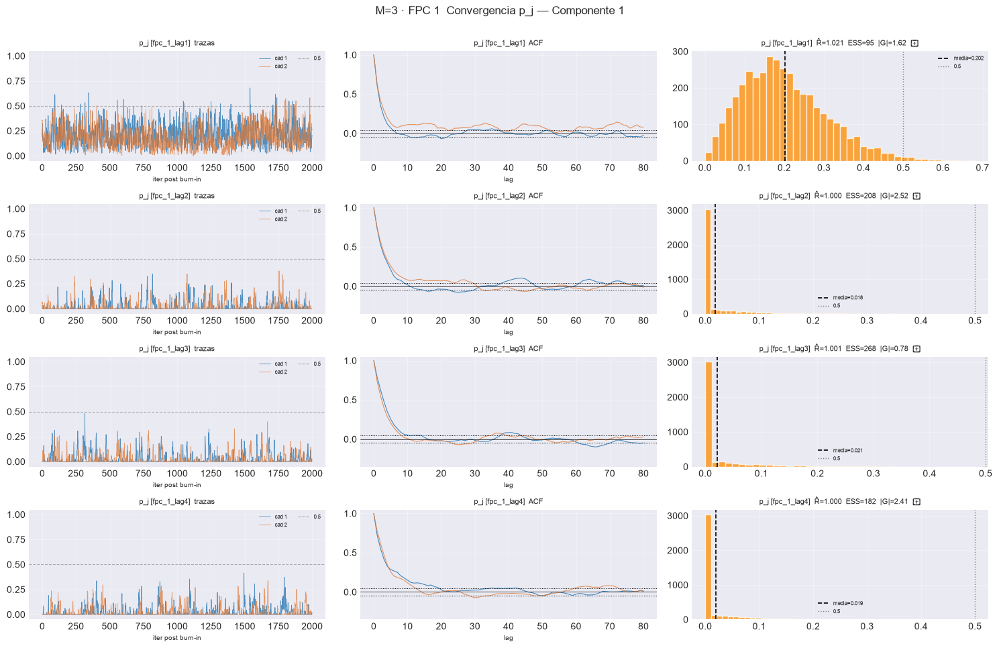

[plot_convergence_bj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_2_lag1  rhat=1.019  ess_min=1683  |G|=1.05  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_2_lag2  rhat=1.001  ess_min=2000  |G|=0.50  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_2_lag3  rhat=1.002  ess_min=1198  |G|=2.17  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.002  ess_min=1789  |G|=1.20  ✓
[plot_convergence_bj[FPC 2]] listo: 4 pasos en 4.3s  1/4 sin converger


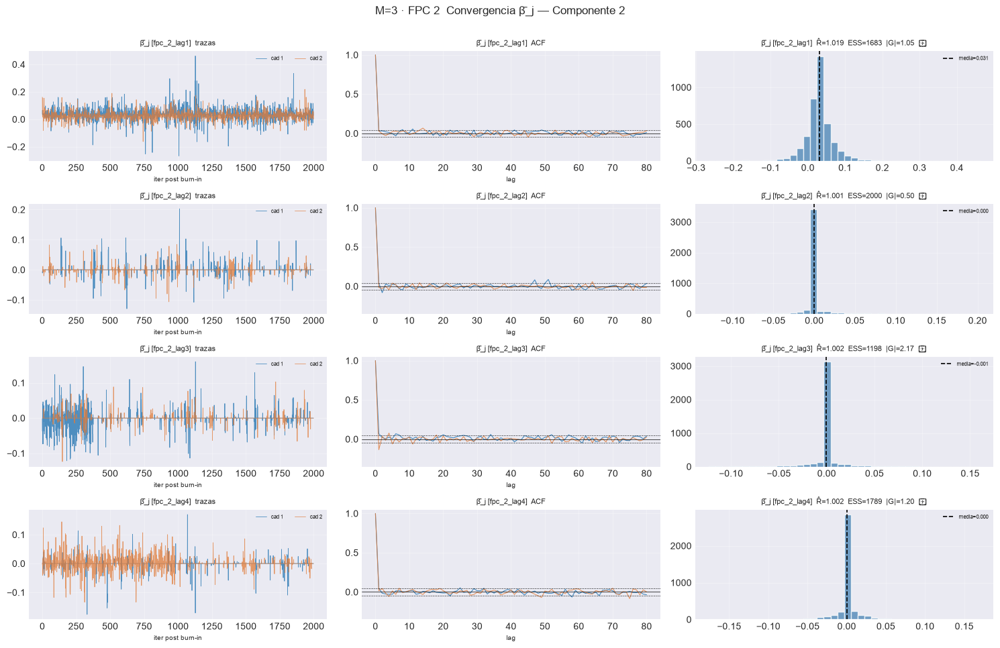

[plot_convergence_pj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_2_lag1  rhat=1.000  ess_min=426  |G|=2.11  ✗
  2/4 (50.0%) t=0.1s eta=0.1s  fpc_2_lag2  rhat=1.003  ess_min=181  |G|=1.06  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_2_lag3  rhat=1.029  ess_min=14  |G|=11.35  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.170  ess_min=8  |G|=9.74  ✗
[plot_convergence_pj[FPC 2]] listo: 4 pasos en 4.1s  3/4 sin converger


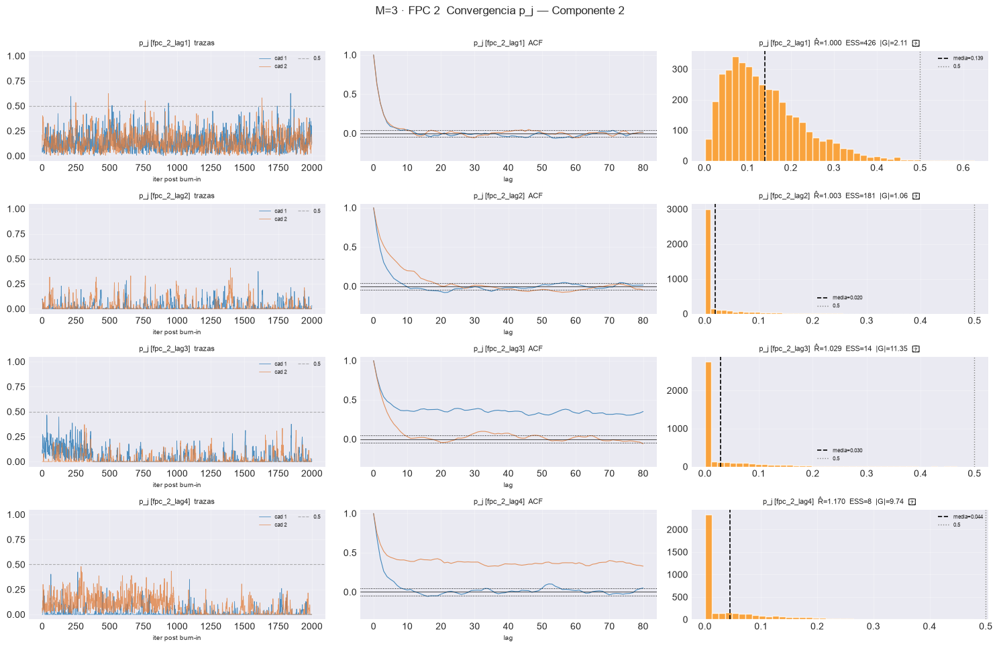

[plot_convergence_bj[FPC 3]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_3_lag1  rhat=1.001  ess_min=1045  |G|=1.15  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_3_lag2  rhat=1.000  ess_min=2000  |G|=1.10  ✓
  3/4 (75.0%) t=0.4s eta=0.1s  fpc_3_lag3  rhat=1.000  ess_min=1693  |G|=0.97  ✓
  4/4 (100.0%) t=0.5s eta=0.0s  fpc_3_lag4  rhat=1.000  ess_min=2000  |G|=0.72  ✓
[plot_convergence_bj[FPC 3]] listo: 4 pasos en 4.4s  0/4 sin converger


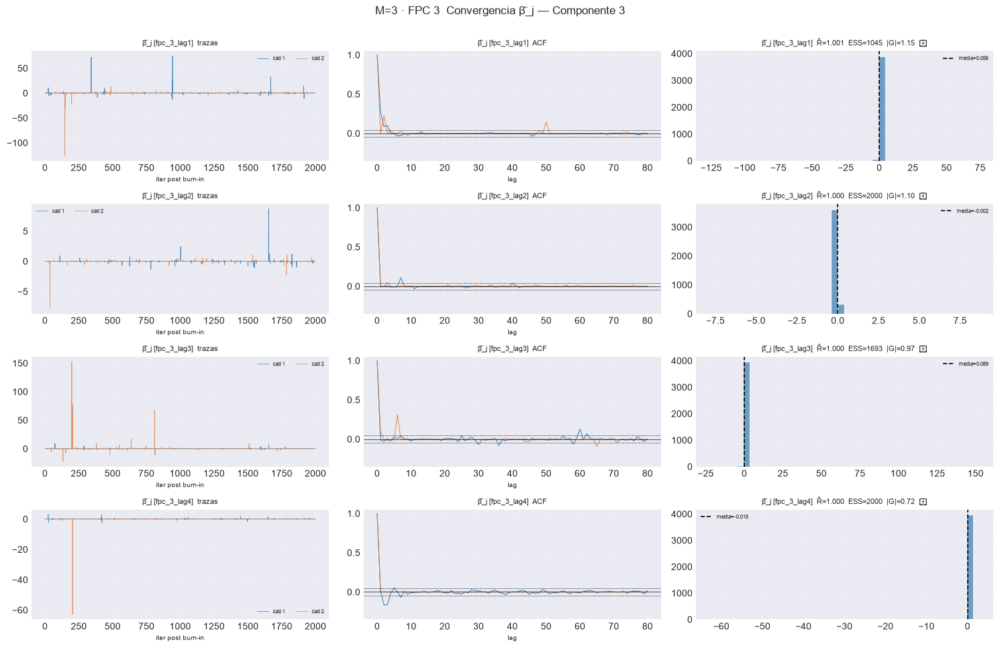

[plot_convergence_pj[FPC 3]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_3_lag1  rhat=1.051  ess_min=267  |G|=1.39  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_3_lag2  rhat=1.004  ess_min=215  |G|=1.74  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_3_lag3  rhat=1.070  ess_min=9  |G|=8.81  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_3_lag4  rhat=1.026  ess_min=199  |G|=0.16  ✓
[plot_convergence_pj[FPC 3]] listo: 4 pasos en 4.4s  1/4 sin converger


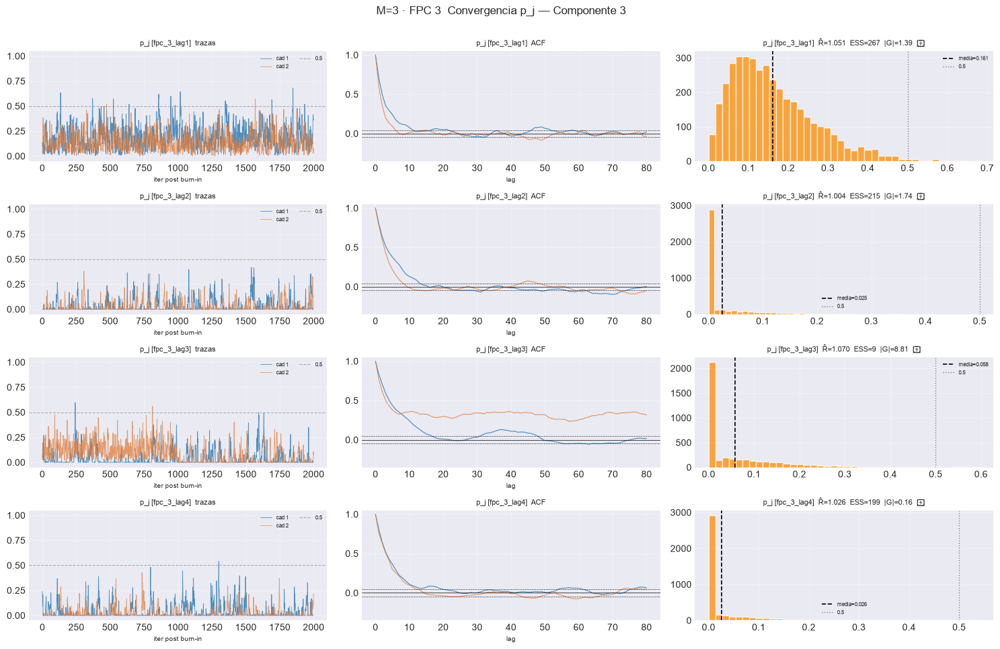

== M=4 ==============================================
[plot_convergence_bj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_1_lag1  rhat=1.009  ess_min=1149  |G|=3.40  ✗
  2/4 (50.0%) t=0.1s eta=0.1s  fpc_1_lag2  rhat=1.000  ess_min=1020  |G|=2.29  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.000  ess_min=1642  |G|=0.57  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=2000  |G|=1.46  ✓
[plot_convergence_bj[FPC 1]] listo: 4 pasos en 4.0s  2/4 sin converger


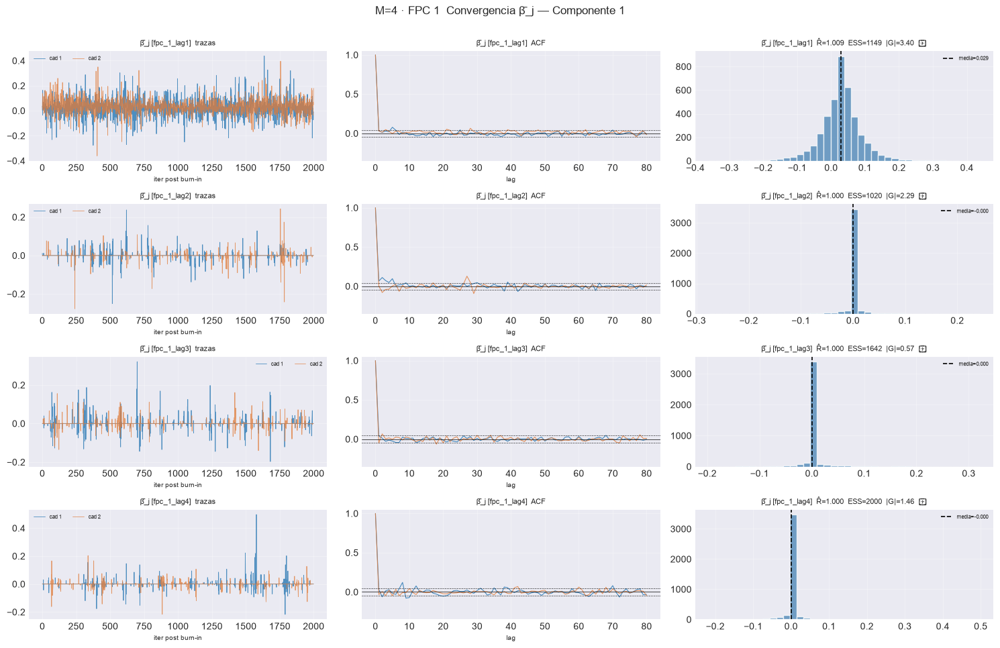

[plot_convergence_pj[FPC 1]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_1_lag1  rhat=1.021  ess_min=95  |G|=1.62  ✗
  2/4 (50.0%) t=0.1s eta=0.1s  fpc_1_lag2  rhat=1.000  ess_min=208  |G|=2.52  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_1_lag3  rhat=1.001  ess_min=268  |G|=0.78  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_1_lag4  rhat=1.000  ess_min=182  |G|=2.41  ✗
[plot_convergence_pj[FPC 1]] listo: 4 pasos en 3.9s  3/4 sin converger


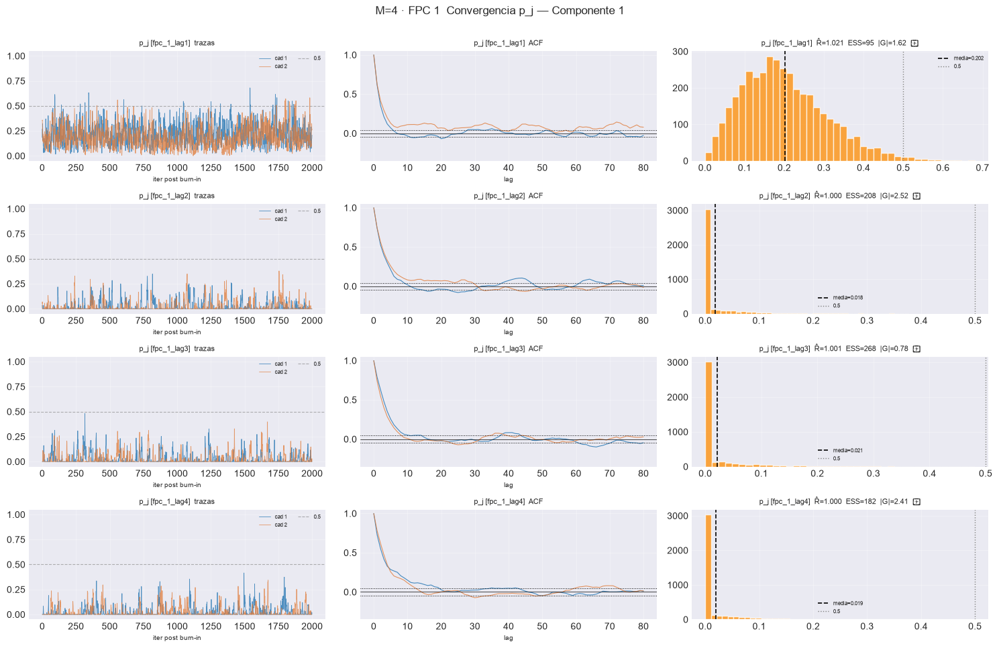

[plot_convergence_bj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_2_lag1  rhat=1.019  ess_min=1683  |G|=1.05  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_2_lag2  rhat=1.001  ess_min=2000  |G|=0.50  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_2_lag3  rhat=1.002  ess_min=1198  |G|=2.17  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.002  ess_min=1789  |G|=1.20  ✓
[plot_convergence_bj[FPC 2]] listo: 4 pasos en 3.9s  1/4 sin converger


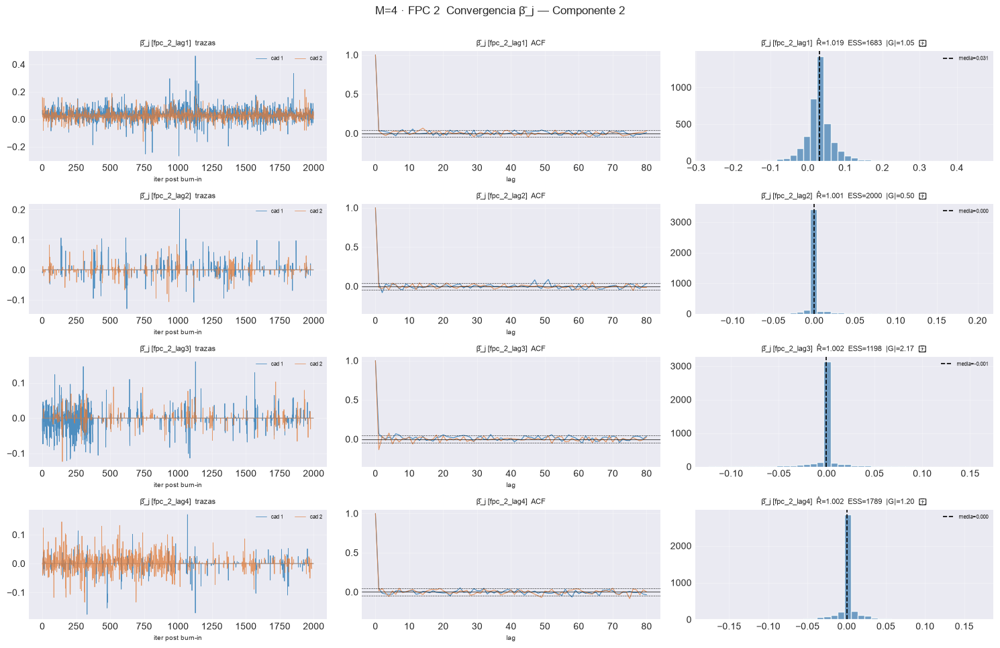

[plot_convergence_pj[FPC 2]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.3s  fpc_2_lag1  rhat=1.000  ess_min=426  |G|=2.11  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_2_lag2  rhat=1.003  ess_min=181  |G|=1.06  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_2_lag3  rhat=1.029  ess_min=14  |G|=11.35  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_2_lag4  rhat=1.170  ess_min=8  |G|=9.74  ✗
[plot_convergence_pj[FPC 2]] listo: 4 pasos en 4.2s  3/4 sin converger


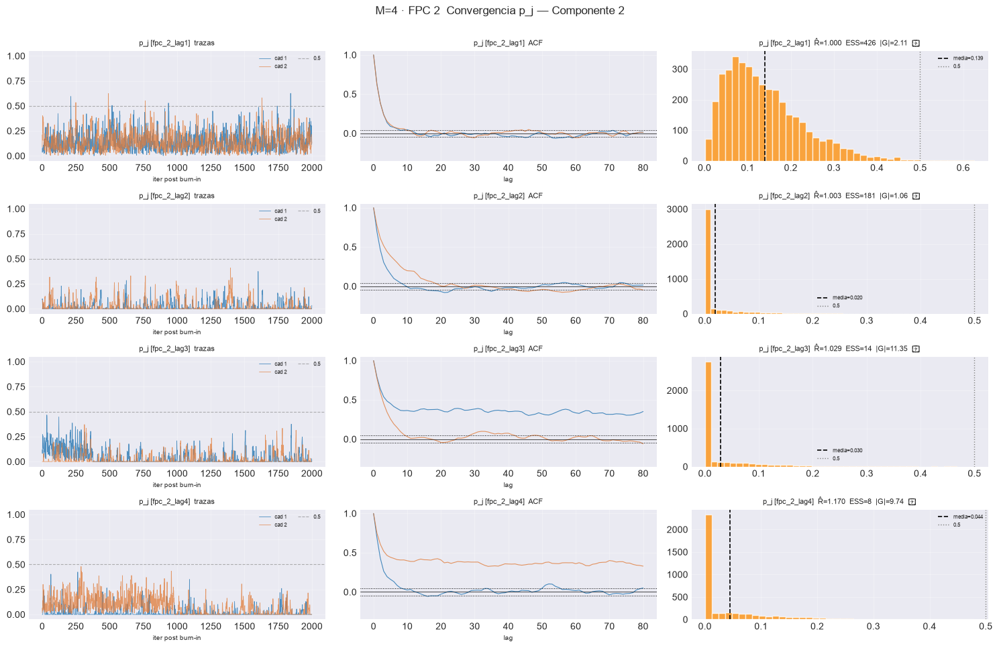

[plot_convergence_bj[FPC 3]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_3_lag1  rhat=1.001  ess_min=1045  |G|=1.15  ✓
  2/4 (50.0%) t=0.1s eta=0.1s  fpc_3_lag2  rhat=1.000  ess_min=2000  |G|=1.10  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_3_lag3  rhat=1.000  ess_min=1693  |G|=0.97  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_3_lag4  rhat=1.000  ess_min=2000  |G|=0.72  ✓
[plot_convergence_bj[FPC 3]] listo: 4 pasos en 4.1s  0/4 sin converger


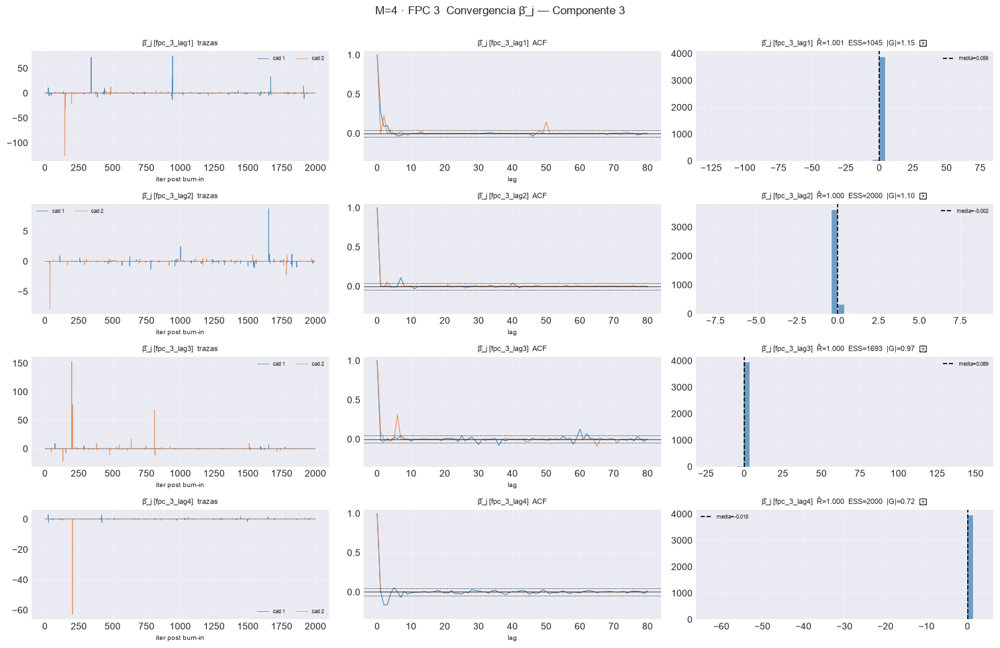

[plot_convergence_pj[FPC 3]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.4s  fpc_3_lag1  rhat=1.051  ess_min=267  |G|=1.39  ✓
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_3_lag2  rhat=1.004  ess_min=215  |G|=1.74  ✓
  3/4 (75.0%) t=0.3s eta=0.1s  fpc_3_lag3  rhat=1.070  ess_min=9  |G|=8.81  ✗
  4/4 (100.0%) t=0.4s eta=0.0s  fpc_3_lag4  rhat=1.026  ess_min=199  |G|=0.16  ✓
[plot_convergence_pj[FPC 3]] listo: 4 pasos en 4.4s  1/4 sin converger


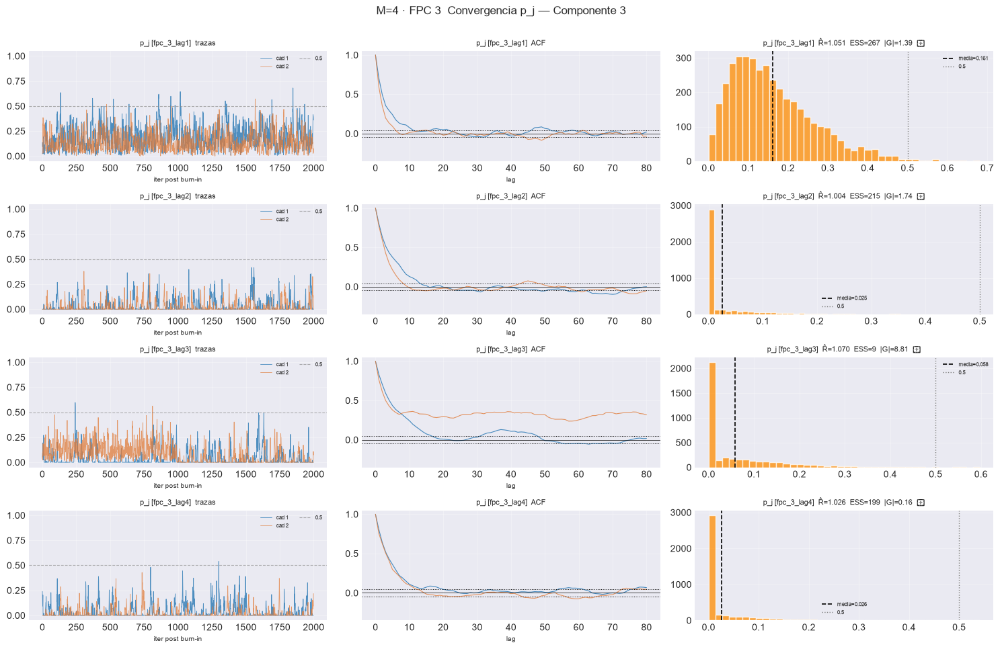

[plot_convergence_bj[FPC 4]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_4_lag1  rhat=1.000  ess_min=1069  |G|=1.15  ✓
  2/4 (50.0%) t=0.1s eta=0.1s  fpc_4_lag2  rhat=1.000  ess_min=1666  |G|=0.74  ✓
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_4_lag3  rhat=1.000  ess_min=1937  |G|=1.29  ✓
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_4_lag4  rhat=1.000  ess_min=1757  |G|=1.17  ✓
[plot_convergence_bj[FPC 4]] listo: 4 pasos en 4.1s  0/4 sin converger


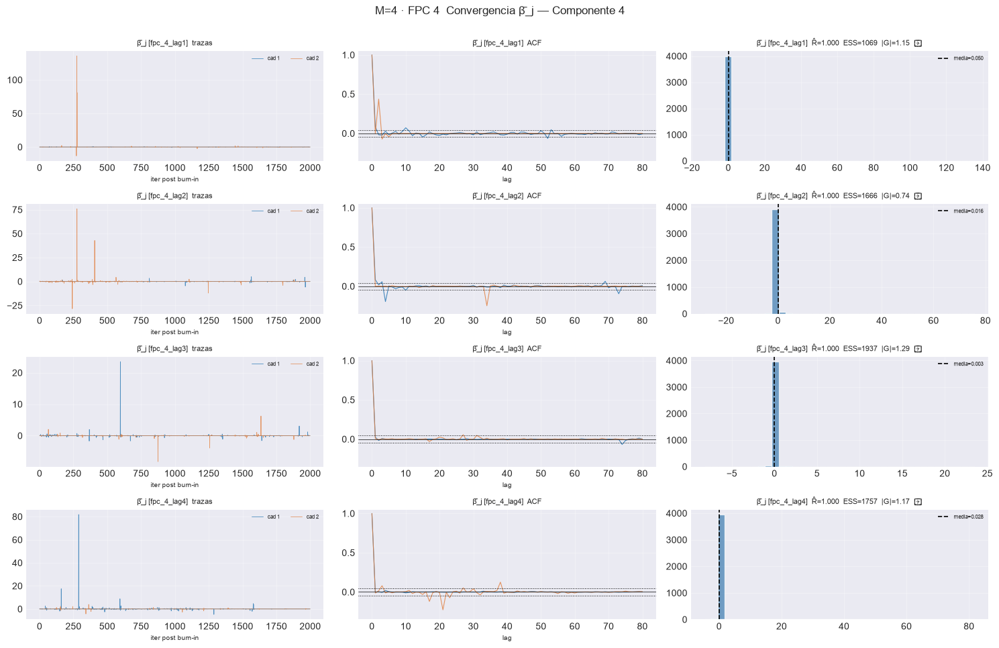

[plot_convergence_pj[FPC 4]] inicio (4 pasos)
  1/4 (25.0%) t=0.1s eta=0.2s  fpc_4_lag1  rhat=1.003  ess_min=171  |G|=2.01  ✗
  2/4 (50.0%) t=0.2s eta=0.2s  fpc_4_lag2  rhat=1.077  ess_min=7  |G|=7.69  ✗
  3/4 (75.0%) t=0.2s eta=0.1s  fpc_4_lag3  rhat=1.007  ess_min=45  |G|=2.17  ✗
  4/4 (100.0%) t=0.3s eta=0.0s  fpc_4_lag4  rhat=1.211  ess_min=8  |G|=4.33  ✗
[plot_convergence_pj[FPC 4]] listo: 4 pasos en 4.0s  4/4 sin converger


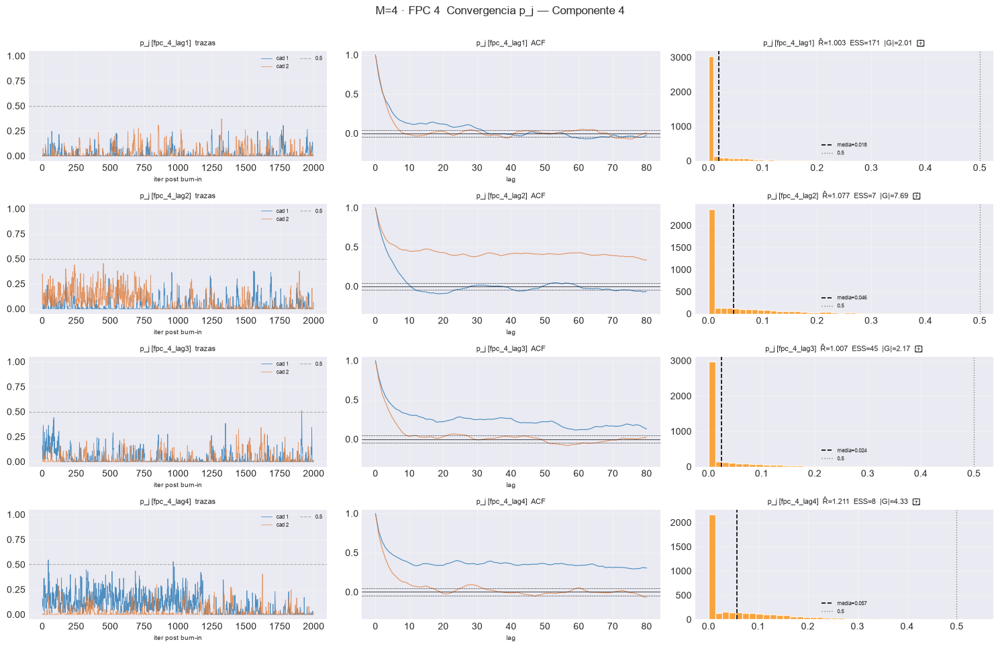

In [11]:
# Traza | ACF | posterior, con las métricas anotadas. beta_j va promediado
# sobre átomos (invariante a la permutación de etiquetas).
# verbose=True saca Rhat/ESS/Geweke por covariable a la consola: son las mismas
# cifras que van en el título de cada panel, pero legibles y copiables sin
# tener que leerlas de la figura.
for M in M_OK:
    e = EST[M]
    print(f"== M={M} " + "=" * 46)
    for k in e["models_chains"]:
        fpc  = e["component_idx"][k] + 1
        feat = e["models_chains"][k][0].feature_names_
        plot_convergence_bj(
            e["models_chains"], k, e["burn"], e["n_iter"], feature_names=feat,
            title_prefix=f"M={M} · FPC {fpc}",
            save_path=str(e["paths"]["out_report"] / f"44_conv_bj_k{fpc}.png"),
            verbose=True)
        plt.show()
        plot_convergence_pj(
            e["models_chains"], k, e["burn"], e["n_iter"], feature_names=feat,
            title_prefix=f"M={M} · FPC {fpc}",
            save_path=str(e["paths"]["out_report"] / f"45_conv_pj_k{fpc}.png"),
            verbose=True)
        plt.show()

## 6. Probabilidades posteriores de inclusión

Tercer eje del diseño (`docs §03_06`): qué variables selecciona el modelo,
contra la estructura de dependencia que el generador realmente usó.


In [12]:
for M in M_OK:
    e = EST[M]
    pip_df = matriz_pip(e["models_chains"], e["burn"],
                        component_idx=e["component_idx"], verbose=True)
    pip_df.to_csv(e["paths"]["out_report"] / "46_pip.csv")
    e["pip_df"] = pip_df

    cols_pip = [c for c in pip_df.columns if not c.endswith("_sd")]
    display(pip_df.style
        .background_gradient(subset=cols_pip, cmap="RdYlGn", vmin=0, vmax=1)
        .format("{:.3f}")
        .set_caption(f"M={M} - P(gamma_j = 1 | datos), inclusión global, "
                     "media entre cadenas +- sd"))

    sd_cols = [c for c in pip_df.columns if c.endswith("_sd")]
    sd_max = float(pip_df[sd_cols].to_numpy().max()) if sd_cols else float("nan")
    e["pip_sd_max"] = sd_max
    print(f"[M={M}] dispersión máxima entre cadenas: {sd_max:.3f}"
          + ("   ! las cadenas discrepan sobre la selección" if sd_max > 0.15
             else "   OK las cadenas coinciden"))

[matriz_pip] inicio (1 pasos)
  1/1 (100.0%) t=0.0s eta=0.0s  FPC 1: 2 cadenas, 4 variables, PIP en [0.044, 1.000]
[matriz_pip] listo: 1 pasos en 0.0s  tabla 4x2


,FPC 1,FPC 1_sd
variable,,
fpc_1_lag1,1.000,0.000
fpc_1_lag2,0.044,0.005
fpc_1_lag3,0.048,0.007
fpc_1_lag4,0.044,0.001


[M=1] dispersión máxima entre cadenas: 0.007   OK las cadenas coinciden
[matriz_pip] inicio (2 pasos)
  1/2 (50.0%) t=0.0s eta=0.0s  FPC 1: 2 cadenas, 4 variables, PIP en [0.044, 1.000]
  2/2 (100.0%) t=0.0s eta=0.0s  FPC 2: 2 cadenas, 4 variables, PIP en [0.046, 1.000]
[matriz_pip] listo: 2 pasos en 0.0s  tabla 8x4


,FPC 1,FPC 1_sd,FPC 2,FPC 2_sd
variable,,,,
fpc_1_lag1,1.000,0.000,nan,nan
fpc_1_lag2,0.044,0.005,nan,nan
fpc_1_lag3,0.048,0.007,nan,nan
fpc_1_lag4,0.044,0.001,nan,nan
fpc_2_lag1,nan,nan,1.000,0.000
fpc_2_lag2,nan,nan,0.046,0.011
fpc_2_lag3,nan,nan,0.137,0.128
fpc_2_lag4,nan,nan,0.277,0.330


[M=2] dispersión máxima entre cadenas: nan   OK las cadenas coinciden
[matriz_pip] inicio (3 pasos)
  1/3 (33.3%) t=0.0s eta=0.0s  FPC 1: 2 cadenas, 4 variables, PIP en [0.044, 1.000]
  2/3 (66.7%) t=0.0s eta=0.0s  FPC 2: 2 cadenas, 4 variables, PIP en [0.046, 1.000]
  3/3 (100.0%) t=0.0s eta=0.0s  FPC 3: 2 cadenas, 4 variables, PIP en [0.060, 1.000]
[matriz_pip] listo: 3 pasos en 0.0s  tabla 12x6


,FPC 1,FPC 1_sd,FPC 2,FPC 2_sd,FPC 3,FPC 3_sd
variable,,,,,,
fpc_1_lag1,1.000,0.000,nan,nan,nan,nan
fpc_1_lag2,0.044,0.005,nan,nan,nan,nan
fpc_1_lag3,0.048,0.007,nan,nan,nan,nan
fpc_1_lag4,0.044,0.001,nan,nan,nan,nan
fpc_2_lag1,nan,nan,1.000,0.000,nan,nan
fpc_2_lag2,nan,nan,0.046,0.011,nan,nan
fpc_2_lag3,nan,nan,0.137,0.128,nan,nan
fpc_2_lag4,nan,nan,0.277,0.330,nan,nan
fpc_3_lag1,nan,nan,nan,nan,1.000,0.000


[M=3] dispersión máxima entre cadenas: nan   OK las cadenas coinciden
[matriz_pip] inicio (4 pasos)
  1/4 (25.0%) t=0.0s eta=0.0s  FPC 1: 2 cadenas, 4 variables, PIP en [0.044, 1.000]
  2/4 (50.0%) t=0.0s eta=0.0s  FPC 2: 2 cadenas, 4 variables, PIP en [0.046, 1.000]
  3/4 (75.0%) t=0.0s eta=0.0s  FPC 3: 2 cadenas, 4 variables, PIP en [0.060, 1.000]
  4/4 (100.0%) t=0.0s eta=0.0s  FPC 4: 2 cadenas, 4 variables, PIP en [0.039, 0.323]
[matriz_pip] listo: 4 pasos en 0.0s  tabla 16x8


,FPC 1,FPC 1_sd,FPC 2,FPC 2_sd,FPC 3,FPC 3_sd,FPC 4,FPC 4_sd
variable,,,,,,,,
fpc_1_lag1,1.000,0.000,nan,nan,nan,nan,nan,nan
fpc_1_lag2,0.044,0.005,nan,nan,nan,nan,nan,nan
fpc_1_lag3,0.048,0.007,nan,nan,nan,nan,nan,nan
fpc_1_lag4,0.044,0.001,nan,nan,nan,nan,nan,nan
fpc_2_lag1,nan,nan,1.000,0.000,nan,nan,nan,nan
fpc_2_lag2,nan,nan,0.046,0.011,nan,nan,nan,nan
fpc_2_lag3,nan,nan,0.137,0.128,nan,nan,nan,nan
fpc_2_lag4,nan,nan,0.277,0.330,nan,nan,nan,nan
fpc_3_lag1,nan,nan,nan,nan,1.000,0.000,nan,nan


[M=4] dispersión máxima entre cadenas: nan   OK las cadenas coinciden


### 6.1 Contraste con la estructura del generador

El Algoritmo B-1 tampoco tiene estructura dispersa que contrastar, aunque
por una razón distinta a la de A-1: la dependencia real opera a través de
TRES RASGOS FUNCIONALES GLOBALES de la curva anterior (nivel, pendiente,
curvatura — ver docstring de `sim_escenario_B1.py`), que en general
tienen proyección no nula sobre TODAS las componentes FPCA retenidas, no
sobre un subconjunto disperso de rezagos propios. La estructura verdadera se
declara igual de forma explícita porque cambia entre escenarios.

Con todas las covariables activas, especificidad y AUC no están definidas de
forma informativa: la cifra útil es `pip_media_activas`, y comparar su valor
**entre $M$** sí lo es —si al subir $M$ el modelo deja de reconocer
covariables que siguen siendo activas, la dilución del prior de selección se
está midiendo directamente.


In [13]:
for M in M_OK:
    e = EST[M]
    # [CONFIG] estructura verdadera del generador. Escenario B-1: la
    # dependencia opera via 3 rasgos funcionales GLOBALES de la curva
    # anterior (nivel/pendiente/curvatura), que en general proyectan sobre
    # TODAS las componentes retenidas => todas las covariables de rezago
    # propio son potencialmente activas.
    VERDAD = {f"FPC {e['component_idx'][k] + 1}": list(e["cov_por_componente"][k])
              for k in range(e["n_components"])}

    contraste = contraste_con_verdad(e["pip_df"], VERDAD, umbral=0.5)
    e["contraste"] = contraste
    if not contraste.empty:
        contraste.to_csv(e["paths"]["out_report"] / "47_contraste_pip.csv")
        display(contraste.style.format("{:.3f}", subset=[
            c for c in contraste.columns if contraste[c].dtype.kind == "f"])
            .set_caption(f"M={M} - selección de variables vs estructura del "
                         "generador (umbral 0.5)"))

print("Con todas las covariables activas, especificidad y AUC no están definidas "
      "de forma informativa: la cifra útil es `pip_media_activas`.")


,n_activas,VP,FP,FN,VN,sensibilidad,especificidad,exactitud,auc,pip_media_activas,pip_media_inactivas
componente,,,,,,,,,,,
FPC 1,4,1,0,3,0,0.250,0.000,0.250,nan,0.284,nan


,n_activas,VP,FP,FN,VN,sensibilidad,especificidad,exactitud,auc,pip_media_activas,pip_media_inactivas
componente,,,,,,,,,,,
FPC 1,4,1,0,3,0,0.250,0.000,0.250,nan,0.284,nan
FPC 2,4,1,0,3,0,0.250,0.000,0.250,nan,0.365,nan


,n_activas,VP,FP,FN,VN,sensibilidad,especificidad,exactitud,auc,pip_media_activas,pip_media_inactivas
componente,,,,,,,,,,,
FPC 1,4,1,0,3,0,0.250,0.000,0.250,nan,0.284,nan
FPC 2,4,1,0,3,0,0.250,0.000,0.250,nan,0.365,nan
FPC 3,4,1,0,3,0,0.250,0.000,0.250,nan,0.358,nan


,n_activas,VP,FP,FN,VN,sensibilidad,especificidad,exactitud,auc,pip_media_activas,pip_media_inactivas
componente,,,,,,,,,,,
FPC 1,4,1,0,3,0,0.250,0.000,0.250,nan,0.284,nan
FPC 2,4,1,0,3,0,0.250,0.000,0.250,nan,0.365,nan
FPC 3,4,1,0,3,0,0.250,0.000,0.250,nan,0.358,nan
FPC 4,4,0,0,4,0,0.000,0.000,0.000,nan,0.171,nan


Con todas las covariables activas, especificidad y AUC no están definidas de forma informativa: la cifra útil es `pip_media_activas`.


## 7. Verificación muestreador ↔ predictor

`inEout` es $E[y\mid x]$ dentro de muestra tal como la calcula MATLAB en cada
iteración. Debe coincidir con lo que el predictor de Python reconstruye a
partir de las mismas trazas. Es la única prueba directa de que ambos lados
interpretan las trazas igual, y falla ruidosamente si el contrato se rompe.

Se corre **en cada $M$**: el contrato depende de $p$, y el punto $M=1$ es
justamente donde MATLAB colapsa la dimensión de covariables al guardar.

In [14]:
print("corr(inEout, predict) sobre el bloque de entrenamiento:")
ok_global = True
for M in M_OK:
    e = EST[M]
    ok = True
    print(f"-- M={M} --")
    for k in e["models_chains"]:
        for c in sorted(e["models_chains"][k]):
            m = e["models_chains"][k][c]
            mu_tr = m.predict(e["dfs_train"][k])
            inE   = m.traces["inEout"][m.burn:].mean(axis=0)
            corr  = float(np.corrcoef(inE, mu_tr)[0, 1])
            dif   = float(np.abs(inE - mu_tr).max())
            ok &= corr > 0.999
            print(f"  FPC {e['component_idx'][k]+1} cadena{c+1}: corr={corr:.6f}  "
                  f"|dif|max={dif:.4f}" + ("" if corr > 0.999 else "   ! REVISAR"))
    e["contrato_ok"] = ok
    ok_global &= ok
    print(f"  {'OK' if ok else 'X'} contrato sampler<->predictor "
          f"{'verificado' if ok else 'FALLA'} en M={M}")

print(f"\n{'OK contrato verificado en todo el barrido' if ok_global else 'X el contrato falla'}")

corr(inEout, predict) sobre el bloque de entrenamiento:
-- M=1 --
  FPC 1 cadena1: corr=1.000000  |dif|max=0.0000
  FPC 1 cadena2: corr=1.000000  |dif|max=0.0000
  OK contrato sampler<->predictor verificado en M=1
-- M=2 --
  FPC 1 cadena1: corr=1.000000  |dif|max=0.0000
  FPC 1 cadena2: corr=1.000000  |dif|max=0.0000
  FPC 2 cadena1: corr=1.000000  |dif|max=0.0001
  FPC 2 cadena2: corr=1.000000  |dif|max=0.0001
  OK contrato sampler<->predictor verificado en M=2
-- M=3 --
  FPC 1 cadena1: corr=1.000000  |dif|max=0.0000
  FPC 1 cadena2: corr=1.000000  |dif|max=0.0000
  FPC 2 cadena1: corr=1.000000  |dif|max=0.0001
  FPC 2 cadena2: corr=1.000000  |dif|max=0.0001
  FPC 3 cadena1: corr=1.000000  |dif|max=0.0000
  FPC 3 cadena2: corr=1.000000  |dif|max=0.0000
  OK contrato sampler<->predictor verificado en M=3
-- M=4 --
  FPC 1 cadena1: corr=1.000000  |dif|max=0.0000
  FPC 1 cadena2: corr=1.000000  |dif|max=0.0000
  FPC 2 cadena1: corr=1.000000  |dif|max=0.0001
  FPC 2 cadena2: corr=1.0000

## 8. Comparación entre los puntos del barrido

| Cifra | Por qué es comparable entre $M$ |
|---|---|
| $\hat R$ máx, ESS mín, Geweke máx | son el **peor caso** sobre las variables de ese punto, no un promedio sobre un número de variables que cambia con $M$ |
| ocupación media de la mezcla | cuenta átomos, no depende de la dimensión |
| PIP media sobre las activas | proporción, acotada en $[0,1]$ |

In [15]:
filas = []
for M in M_OK:
    e   = EST[M]
    res = e["res_conv"]
    ocu = e["ocup_df"]
    con = e["contraste"]

    fila = {
        "M": M,
        "experiment_id": e["eid"],
        "p_covariables": len(e["cov_por_componente"][0]),
        "n_variables_diag": int(res["n_variables"]),
        "rhat_max": float(res["rhat_max"]),
        "ess_min": float(res["ess_min"]),
        "geweke_max": float(res["geweke_max"]),
        "n_no_converge": int(res["n_no_converge"]),
        "converge": bool(res["todo_converge"]),
        "ocupacion_media": float(ocu["media"].mean()),
        "ocupacion_max": int(ocu["max"].max()),
        "N_trunc": int(ocu["N_trunc"].iloc[0]),
        "toca_truncamiento": bool(ocu["toca_truncamiento"].any()),
        "pip_sd_max": e["pip_sd_max"],
        "contrato_ok": bool(e["contrato_ok"]),
    }
    # `contraste_con_verdad` devuelve una fila por componente FPCA; se promedia
    # sobre componentes para tener UNA cifra por punto del barrido.
    if con is not None and not con.empty and "pip_media_activas" in con.columns:
        fila["pip_media_activas"] = float(con["pip_media_activas"].mean())
    filas.append(fila)

barrido_df = pd.DataFrame(filas).set_index("M")
barrido_df.to_csv(PATH_BARRIDO / "80_convergencia_por_M.csv")

_fmt = {c: "{:.4f}" for c in ("rhat_max", "geweke_max", "pip_sd_max",
                              "pip_media_activas") if c in barrido_df.columns}
_fmt.update({"ess_min": "{:.0f}", "ocupacion_media": "{:.2f}"})
display(barrido_df.style.format(_fmt, na_rep="-")
        .background_gradient(subset=["rhat_max"], cmap="RdYlGn_r", vmin=1.0, vmax=1.2)
        .background_gradient(subset=["ess_min"], cmap="RdYlGn", vmin=0, vmax=500)
        .set_caption("Diagnóstico de muestreo a lo largo del barrido en M"))

,experiment_id,p_covariables,n_variables_diag,rhat_max,ess_min,geweke_max,n_no_converge,converge,ocupacion_media,ocupacion_max,N_trunc,toca_truncamiento,pip_sd_max,contrato_ok,pip_media_activas
M,,,,,,,,,,,,,,,
1,escenario_104_1_r01_m01,4,8,1.0211,95,3.3973,5,False,10.98,28,30,False,0.0067,True,0.2841
2,escenario_104_1_r01_m02,4,16,1.1700,8,11.3541,9,False,11.30,30,30,True,-,True,0.3244
3,escenario_104_1_r01_m03,4,24,1.1700,8,11.3541,10,False,10.62,30,30,True,-,True,0.3357
4,escenario_104_1_r01_m04,4,32,1.2107,7,11.3541,14,False,10.65,30,30,True,-,True,0.2945


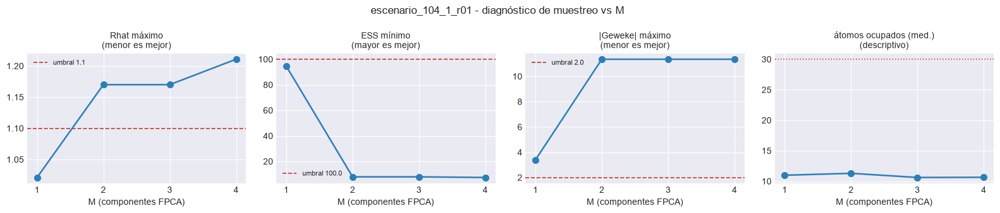

In [16]:
# Figura del barrido: cuatro paneles, todos con M en el eje x. Los umbrales van
# como línea horizontal para que la lectura no dependa de recordar cuáles son.
_Ms = list(barrido_df.index)
_um = EST[M_OK[0]]["res_conv"]["umbrales"]

paneles = [
    ("rhat_max",        "Rhat máximo",            _um["rhat"],   "menor es mejor"),
    ("ess_min",         "ESS mínimo",             _um["ess"],    "mayor es mejor"),
    ("geweke_max",      "|Geweke| máximo",        _um["geweke"], "menor es mejor"),
    ("ocupacion_media", "átomos ocupados (med.)", None,          "descriptivo"),
]

fig, axes = plt.subplots(1, len(paneles), figsize=(4.0 * len(paneles), 3.4),
                         squeeze=False)
for ax, (col, titulo, umbral, nota) in zip(axes[0], paneles):
    y = barrido_df[col].to_numpy(dtype=float)
    ax.plot(_Ms, y, "o-", lw=1.8, ms=7, color="#2c7fb8")
    if umbral is not None:
        ax.axhline(umbral, color="#c0392b", ls="--", lw=1.2,
                   label=f"umbral {umbral}")
        ax.legend(fontsize=8)
    if col == "ocupacion_media":
        ax.axhline(barrido_df["N_trunc"].iloc[0], color="#c0392b", ls=":", lw=1.2)
    ax.set_xticks(_Ms)
    ax.set_xlabel("M (componentes FPCA)")
    ax.set_title(f"{titulo}\n({nota})", fontsize=10)
fig.suptitle(f"{EXPERIMENT_BASE} - diagnóstico de muestreo vs M", fontsize=12)
fig.tight_layout()
fig.savefig(PATH_BARRIDO / "81_diagnostico_vs_M.png", dpi=150, bbox_inches="tight")
plt.show()

FPC,1,2,3,4
M,,,,
1,10.98,-,-,-
2,10.98,11.61,-,-
3,10.98,11.61,9.25,-
4,10.98,11.61,9.25,10.74


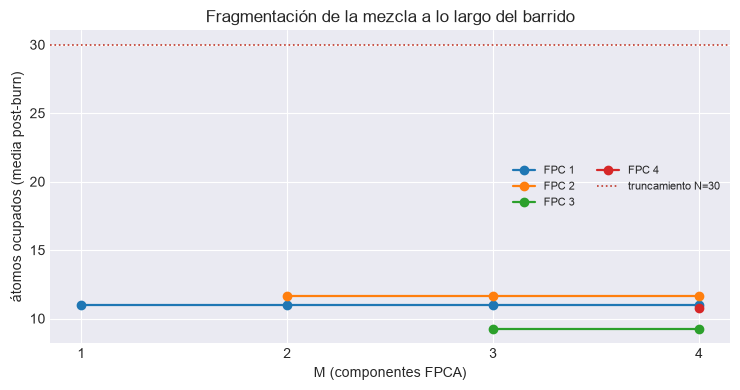

In [17]:
# Ocupación de la mezcla por M y componente: es la cifra que dice si al subir M
# el modelo parte la mezcla en más átomos. Se separa por FPC porque el promedio
# global esconde que sean las componentes NUEVAS las que se fragmentan.
ocup_todo = pd.concat([EST[M]["ocup_df"] for M in M_OK], ignore_index=True)
ocup_todo.to_csv(PATH_BARRIDO / "82_ocupacion_por_M.csv", index=False)

piv = ocup_todo.groupby(["M", "FPC"])["media"].mean().unstack("FPC")
display(piv.style.format("{:.2f}", na_rep="-")
        .background_gradient(cmap="RdYlGn_r", axis=None)
        .set_caption("Átomos ocupados (media post-burn) por M y componente FPCA"))

fig, ax = plt.subplots(figsize=(7.5, 4.0))
for fpc in piv.columns:
    s = piv[fpc].dropna()
    ax.plot(s.index, s.to_numpy(), "o-", lw=1.6, ms=6, label=f"FPC {int(fpc)}")
_Ntr = int(ocup_todo["N_trunc"].iloc[0])
ax.axhline(_Ntr, color="#c0392b", ls=":", lw=1.2, label=f"truncamiento N={_Ntr}")
ax.set_xticks(list(piv.index))
ax.set_xlabel("M (componentes FPCA)")
ax.set_ylabel("átomos ocupados (media post-burn)")
ax.set_title("Fragmentación de la mezcla a lo largo del barrido")
ax.legend(fontsize=8, ncol=2)
fig.tight_layout()
fig.savefig(PATH_BARRIDO / "82_ocupacion_por_M.png", dpi=150, bbox_inches="tight")
plt.show()

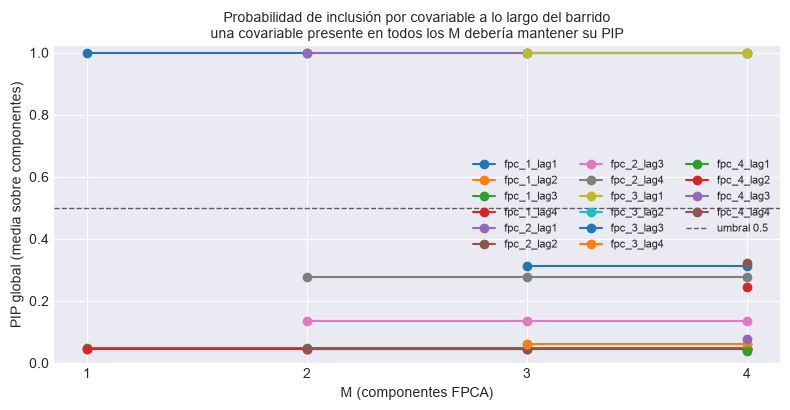

Las covariables que sólo existen a partir de cierto M aparecen con la línea cortada: no es un hueco de datos, es que esa covariable no existe en los puntos más chicos del barrido.


In [18]:
# PIP: una fila por (M, componente FPCA, covariable). Las matrices de distintos
# M no se apilan tal cual porque no comparten ni filas ni columnas, así que se
# pasan a formato largo, que sí admite la comparación.
partes = []
for M in M_OK:
    pip  = EST[M]["pip_df"]
    cols = [c for c in pip.columns if not c.endswith("_sd")]
    largo = pip[cols].stack().rename("pip").reset_index()
    largo.columns = ["covariable", "componente", "pip"]
    largo.insert(0, "M", M)
    partes.append(largo)

pip_largo = pd.concat(partes, ignore_index=True)
pip_largo.to_csv(PATH_BARRIDO / "83_pip_por_M.csv", index=False)

fig, ax = plt.subplots(figsize=(8.0, 4.2))
for cov, g in pip_largo.groupby("covariable"):
    s = g.groupby("M")["pip"].mean()
    ax.plot(s.index, s.to_numpy(), "o-", lw=1.5, ms=6, label=str(cov))
ax.axhline(0.5, color="k", ls="--", lw=1, alpha=0.6, label="umbral 0.5")
ax.set_xticks(list(M_OK))
ax.set_ylim(0, 1.02)
ax.set_xlabel("M (componentes FPCA)")
ax.set_ylabel("PIP global (media sobre componentes)")
ax.set_title("Probabilidad de inclusión por covariable a lo largo del barrido\n"
             "una covariable presente en todos los M debería mantener su PIP",
             fontsize=10)
ax.legend(fontsize=8, ncol=3)
fig.tight_layout()
fig.savefig(PATH_BARRIDO / "83_pip_por_M.png", dpi=150, bbox_inches="tight")
plt.show()

print("Las covariables que sólo existen a partir de cierto M aparecen con la "
      "línea cortada: no es un hueco de datos, es que esa covariable no existe "
      "en los puntos más chicos del barrido.")

In [19]:
# == Veredicto del barrido ===================================================
print("=" * 66)
print(f"  BARRIDO {EXPERIMENT_BASE}   ·   M evaluados: {list(M_OK)}")
print("=" * 66)
for M in M_OK:
    f = barrido_df.loc[M]
    print(f"  M={M}  p={int(f['p_covariables'])}  "
          f"Rhatmax={f['rhat_max']:.3f}  ESSmin={f['ess_min']:.0f}  "
          f"ocup={f['ocupacion_media']:.1f}/{int(f['N_trunc'])}  "
          f"{'OK' if f['converge'] else 'X NO CONVERGE'}")

_no   = [int(M) for M in barrido_df.index if not barrido_df.loc[M, "converge"]]
_falt = sorted(set(M_FPCA_LIST) - set(M_OK))
print("-" * 66)
if _falt:
    print(f"! sin trazas todavía: M = {_falt}  -> correr psbp_fd_iteracion.m")
if _no:
    print(f"X NO convergen: M = {_no}. Excluirlos de la comparación de 104_04/104_05,")
    print("  o subir nsim/burn antes de leer su MISE como efecto de M.")
else:
    print("OK todo el barrido converge: las diferencias que 104_04 encuentre entre")
    print("   los M son atribuibles al modelo y no al muestreo.")

# Tendencia, sólo con al menos tres puntos: con dos, cualquier par define una
# recta y la pendiente no dice nada.
if len(M_OK) >= 3:
    _r = np.corrcoef(list(M_OK), barrido_df["rhat_max"].to_numpy())[0, 1]
    _e = np.corrcoef(list(M_OK), barrido_df["ess_min"].to_numpy())[0, 1]
    print(f"\ncorr(M, Rhatmax) = {_r:+.3f}   ·   corr(M, ESSmin) = {_e:+.3f}")
    if _r > 0.8 or _e < -0.8:
        print("  <- el muestreo se degrada monótonamente con M: parte de lo que")
        print("     104_04 atribuya a M sería esfuerzo de muestreo insuficiente.")
print("=" * 66)
print(f"Tablas y figuras cruzadas en {PATH_BARRIDO}  (archivos 80-83)")
print("Continuar con 104_04_evaluacion, declarando el mismo M_FPCA_LIST.")

  BARRIDO escenario_104_1_r01   ·   M evaluados: [1, 2, 3, 4]
  M=1  p=4  Rhatmax=1.021  ESSmin=95  ocup=11.0/30  X NO CONVERGE
  M=2  p=4  Rhatmax=1.170  ESSmin=8  ocup=11.3/30  X NO CONVERGE
  M=3  p=4  Rhatmax=1.170  ESSmin=8  ocup=10.6/30  X NO CONVERGE
  M=4  p=4  Rhatmax=1.211  ESSmin=7  ocup=10.6/30  X NO CONVERGE
------------------------------------------------------------------
X NO convergen: M = [1, 2, 3, 4]. Excluirlos de la comparación de 104_04/104_05,
  o subir nsim/burn antes de leer su MISE como efecto de M.

corr(M, Rhatmax) = +0.880   ·   corr(M, ESSmin) = -0.778
  <- el muestreo se degrada monótonamente con M: parte de lo que
     104_04 atribuya a M sería esfuerzo de muestreo insuficiente.
Tablas y figuras cruzadas en C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\reports\simulaciones\escenario_104_1_r01_barrido_M  (archivos 80-83)
Continuar con 104_04_evaluacion, declarando el mismo M_FPCA_LIST.
